<a href="https://colab.research.google.com/github/Daniel9215/MCD/blob/main/Cartera_Coopcarvajal_202404.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Trabajo de Grado - Maestría en Ciencia de Datos
## Construcción de Score de Credito para una Cooperativa de Cali - Valle del Cauca
### Daniel Alejandro Rengifo Aguirre

### 1 Importación de Librerías

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import matplotlib.pyplot as plt
import pandas as pd   ## Libreria para manipular y analizar datos
import seaborn as sns   ## Libreria para visualizar
import plotly  ## Libreria para visualizaciones interactivas
import matplotlib.ticker as mtick  ## función para formatear en visualizaciones
from scipy.stats import norm ## distribución normal
from scipy.stats import poisson ## distribución Poisson
from scipy.stats import t ## distribución t
from scipy.stats import ttest_1samp  ## Prueba t
import statsmodels.stats as sm  ## estadísticas
import statsmodels.api as sm1  ## estadísticas
from scipy.stats import skew, kurtosis
from statsmodels.graphics.gofplots import qqplot

In [ ]:
# Ajustar la configuración para mostrar todas las columnas
pd.set_option('display.max_columns', None)

# Ajustar la configuración para mostrar todas las filas
pd.set_option('display.max_rows', None)

# Mostrar todo el ancho de las columnas
pd.set_option('display.max_colwidth', None)

# Permitir que el DataFrame se expanda en varias líneas
pd.set_option('display.expand_frame_repr', False)


### 1.1 Primer análisis de la Data

La información objeto del presenta estudio obedece a los datos extraidos directamente de la Cooperativa, a traves de un proceso de extracción se cuenta con la siguiente información la cual contiene variables cualitativas y cuantitativas de los asociados que presentan endeudamiento con la entidad al corte de Abril de 2024. En este primer análisis observamos que el Dataset, cuenta con 6628 registros, cada uno de estos tiene que ver con cada obligación vigente dentro de la contabilidad de la Cooperativa y su información asociada para cada una de las columnas del dataset, en su totalidad son 113 campos a analizar.

In [ ]:
df.shape

(6628, 116)

### Diccionario de Variables

Suc. Cliente: Código de la Sucursal a la que pertenece el Asociado (Cali, Medellin, Bogotá o Barranquilla)
Id. Cliente: Número de Id del Asociado
Nombre: Nombre Completo del Asociado                              
Estado: Estado Activo, Sancionado o No Activo del Asociado
Medio de pago: Nombre de la pagaduría asociada a la obligación
cod empleado:
Fec. Ult Afili: Fecha de la última afiliación del asociado
Fec. Ult retiro: Fecha del retiro del asociado
Fec. nacimi: Fecha de nacimiento del asociado
edad: Al corte de la información
seccion: Tipo de cuenta de cobro, Individual o no Definida
Tipo de asociado: Descripción del Asociado, Empleado actual, Ex-Empleaddo, Pensionado, ETC
Sueldo: Salario en Pesos
Veces SMLV: Salario en Pesos / SMMLV
Cod Ubica1: Codigo de la Oficina donde se radicó y desembolsó el credito                        
Nom Ubica1: Nombre de la Oficina                        
Cod Ubica2:Codigo Sede de la Oficina                        
Nom Ubica2 Nombre Sede de la Oficina                       
Cod Depend: Código de la dependencia o empresa asociada a carvajal donde labora el asociado                        
Nom Depend: Nombre de la empresa asociada a carvajal en la que labora el asociado
Dirección Correspondencia: Dirección de correspondencia
Ciudad Correspondencia: Ciudad
Departamento: Departamento                  
Telefono: Telefono                  
Fax: Fax    
correo Electronico: Correo
Fech.Ult.Act.Datos: Actualización de Datos
Tipo Docum.Id: Documento ID
Desc.Tip.Doc: Descripción
Sexo: M / F
antiguedad: Número de meses desde la última afiliación del asociado
estado_civil: Soltero, Casado, Union Libre, ETC...
nro_hijos: Cantidad de Hijos
personas_acargo: Número de personas a cargo      
estrato: Estrato Socio-Económico
nivel_educativo: Bachiller, Profesional, Posgrado, ETC...
valor_ingreso_mensual: Valor del Ingreso Mensual
valor_egreso_mensual: Valor de Egreso Mensual
declara_renta: Y / N                              
tipo_contrato: Termino Indefinido, Prestación de Servicio, Termino Fijo, ETC...
desc_tipo_vivienda: Familiar, Propia, Alquilada, Hipotecada
APORTES ORDINARIOS: Saldo de los aportes totales mensuales acumulados
AHORRO PERMANENTE: Saldo del ahorro permanente
CAPITALIZACION DE APORTES: Valor del Rendimiento de los aportes
APORTES POR CUOTA DE AFILIACION:
AHORRO PLAN FUTURO 0.5%: Ahorro adicional plan futuro
Sld Aportes: Saldo de los aportes
Tipo Obl: 10 - Creditos Asociados - 12 Credito Empleado Cooperativa                        
No. Obligación: Número de la obligación
Monto Solicitado: Monto Solicitado del Crédito
Saldo Capital: Saldo Capital al corte
Sld Int: Saldo Interes                              
Sld Mora: Saldo en mora              
Dias Vencidos: Mora
Venc.Capital: Saldo vencido capital       
Tasa Col.(NAMV): Tasa Col                    
Tasa Peridodo(NAMV): Tasa Nominal Anual Mes Vencida a la que se otorgó el crédito      
Clasificacion: 1 - Consumo 3 - Vivienda
Linea de credito: Financiero (Credito), Conceptos no Financiados (Seguros y Servicios)
Destinacion: Tipo de Producto
Modalidad: Descripción de la modalidad del producto                    
Medio de pago Obligación: Empresa pagadora
Tipo Garantia: Descripción Garantía                             
Vlr.Garantia: Valor
Vlr.Cobertura Disponible: Cobertura sobre el saldo de la deuda
Vlr Prov.Capital: Provisión del capital
Vlr. Prov.Interes: Provisión de Interes                      
Vlr Aportes Util. en la Provision: Aportes usados en provisión      
Fec.Aprobacion: Fecha de la Aprobación
Fec. Prestamo: Fecha de la aprobación                         
Fec.Liquidacion: Fecha de la preliquidación                      
Vlr Cuota: Valor de la cuota                                  
No.Cuotas: Cantidad de Cuotas                   
Periodicidad: Mensual / Quincenal                 
Fec Inicio: Fecha de iniciación de la obligacion                       
Fec. Vcto Final: fecha de terminación de la obligacion
Altura: Mora al corte
Fec Vencto                                 object
Calif.Antes Ley Arrast: Calificación antes de Máxima calificación generada
Calif. Aplicada: Calificación definitiva
Calif.Mes Ant: Calificación del mes anterior
Int Cte Orden: interese de cuentas de orden
Int Mora Orden: Interese de mora en cuentas de orden
Fec.Historico: Fecha corte de la información
Sld Seg Vida: Saldo seguro de vida
Sld Seg Patrimonial: Seguro Patrimonial
Forma de Pago: Nomina o Ventanilla                          
Fec Ult.Pago: Último pago
Cuenta Contable: Cuenta donde registra la obligacion contable
Suc.Credito: Código de la sucursal que desembolsó
Cód. Garantía: codigo de garantía
Cantidad Garantías: # de garantias
%Cobertura Garant: Cobertura de la garantía sobre el saldo
Vlr.aplicado Garant.: Valor Aplicado
Codeudores: Descripción de los codeudores                          
Garantía Real: Tipo de prenda                            
Pagare: Número de la Obligacion
C Costo Cli.                   
C Costo Obl                    
Dias vencidos Int: Días de Mora de la Obligación              
Instan.Aprob.
Vencido Int: Días vencido interes
Dias Vencidos Capital: Días vencido capital            
Probabilidad de incumplimiento sistema: Probabilidad de Incumplimiento calculada del Modelo de Referencia    
Probabilidad de incumplimiento manual:  Probabilidad de Incumplimiento calculada del sistema
Perdida dado incumplimiento sistema: Perdida después del incumplimientodel Modelo de Referencia
Perdida dado incumplimiento manual: Perdida después del incumplimientodel Modelo de Referencia
Valor expuesto: Valor Aportes - Saldo Capital                     
valor perdida esperada aplicada: Provisión Individual Acumulada de la obligación
Valor comercial activos: Valor de los activos del cliente
Valor saldo pasivos: Valor pasivos del cliente
Scoring: Variable Objetivo - Puntaje de Decisión del Score
Fecha Corte : Mes de la información Analizada

Se encontraron variables con valores nulos, en próximos apartados se realizará una decisión sobre como abordar este problema. Sin embargo, para las variabless PI Manual & PDI Manual se recomienda no usarlas dentro del ejercicio

In [ ]:
df.dtypes

Suc. Cliente                                int64
Estado                                     object
Medio de pago                              object
cod empleado                              float64
Fec. Ult Afili                             object
Fec. Ult retiro                            object
Fec. nacimi                                object
edad                                        int64
seccion                                    object
Tipo de asociado                           object
Sueldo                                    float64
# Veces SMLV                              float64
Cod Ubica1                                 object
Nom Ubica1                                 object
Cod Ubica2                                 object
Nom Ubica2                                 object
Cod Depend                                  int64
Nom Depend                                 object
Dirección Correspondencia                  object
Ciudad Correspondencia                     object


In [ ]:
df.describe()

,Suc. Cliente,cod empleado,edad,Sueldo,# Veces SMLV,Cod Depend,antiguedad,nro_hijos,personas_acargo,valor_ingreso_mensual,valor_egreso_mensual,APORTES ORDINARIOS,AHORRO PERMANENTE,CAPITALIZACION DE APORTES,APORTES POR CUOTA DE AFILIACION,AHORRO PLAN FUTURO 0.5%,Sld Aportes,Tipo Obl.,No. Obligación,Monto Solicitado,Saldo Capital,Sld Int,Sld Mora,Dias Vencidos,Venc.Capital,Tasa Col.(NAMV),Tasa Peridodo(NAMV),Vlr Garantia,Vlr.Cobertura Disponible,Vlr Prov.Capital,Vlr. Prov.Interes,Vlr Aportes Util. en la Provision,Vlr Cuota,No.Cuotas,Altura,Int Cte Orden,Int Mora Orden,Sld Seg Vida,Sld Seg Patrimonial,Cuenta Contable,Suc.Credito,Cód. Garantía,Cantidad Garantías,%Cobertura Garant.,Vlr.aplicado Garant.,C Costo Cli.,C Costo Obl,Dias vencidos Int,Instan.Aprob.,Vencido Int,Dias Vencidos Capital,Probabilidad de incumplimiento sistema,Probabilidad de incumplimiento manual,Perdida dado incumplimiento sistema,Perdida dado incumplimiento manual,Valor expuesto,valor perdida esperada aplicada,Valor comercial activos,Valor saldo pasivos,Scoring,Fecha Corte,Antigüedad Años,Solvencia,Deuda / Ingreso
count,6628.000000,3.012000e+03,6628.000000,6.628000e+03,6628.000000,6628.000000,6628.000000,6628.000000,6628.000000,6.628000e+03,6.628000e+03,6.628000e+03,6.628000e+03,6628.0,6628.0,6628.0,6.628000e+03,6628.000000,6.628000e+03,6.628000e+03,6.628000e+03,6.628000e+03,6.628000e+03,6628.000000,6.628000e+03,6.628000e+03,6628.000000,6.628000e+03,6.628000e+03,5.923000e+03,5.923000e+03,6.628000e+03,6.628000e+03,6628.000000,6628.000000,6.628000e+03,6.628000e+03,6.628000e+03,6628.0,6.628000e+03,6628.000000,3.120000e+02,6628.000000,312.000000,6.628000e+03,6628.0,6628.0,6628.000000,1439.000000,6.628000e+03,6628.000000,6628.000000,0.0,6628.000000,0.0,6.628000e+03,6.628000e+03,6.628000e+03,6.628000e+03,6628.000000,6628.0,6628.000000,6.628000e+03,6.620000e+03
mean,2.601388,1.846310e+06,46.236119,4.768156e+06,3.667812,6.301298,4730.608027,1.112553,1.231442,4.819439e+06,6.809189e+05,9.126706e+06,9.746567e+04,0.0,0.0,0.0,9.126706e+06,10.000302,2.405484e+08,1.557827e+07,9.780290e+06,8.103893e+04,4.554734e+04,22.249698,-2.882860e+04,7.295782e+06,15.631955,4.387028e+06,4.138755e+06,3.273847e+05,1.640108e+04,2.853345e+06,3.593666e+05,48.850935,17.050543,3.874878e+04,4.470564e+04,4.695117e+03,0.0,1.444719e+07,2.282740,6.080845e+07,0.047073,69.086538,1.888227e+06,999.0,999.0,20.924261,4.894371,6.971988e+04,22.249698,0.013024,NaN,0.640759,NaN,5.534409e+06,2.740665e+05,1.772160e+08,3.259144e+07,70.398763,202404.0,13.140578,7.854040e+06,3.071328e+03
std,1.926555,2.767972e+06,12.779151,4.793415e+06,3.687242,54.042172,4032.514659,1.016243,1.166853,4.831118e+06,9.606809e+05,9.539439e+06,2.265994e+05,0.0,0.0,0.0,9.539439e+06,0.024566,1.575465e+08,2.385190e+07,1.832911e+07,9.697240e+05,5.738292e+05,183.755137,1.615287e+06,3.508774e+07,6.868123,2.521629e+07,2.487215e+07,3.078900e+06,1.913291e+05,4.207395e+06,4.332345e+05,38.511408,20.017233,8.162407e+05,5.718304e+05,5.432215e+04,0.0,3.257330e+05,1.667382,9.730529e+07,0.211811,7.579093,1.369696e+07,0.0,0.0,175.331563,1.222171,9.596135e+05,183.755137,0.041034,NaN,0.268396,NaN,1.074332e+07,2.426181e+06,3.149474e+08,7.867051e+07,27.739957,0.0,11.201430,4.568641e+07,2.133751e+05
min,1.000000,0.000000e+00,18.000000,0.000000e+00,0.000000,0.000000,7.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.000000e+00,10.000000,1.000000e+08,1.000000e+04,0.000000e+00,-5.750962e+06,0.000000e+00,0.000000,-3.582061e+07,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-2.180000e+00,1.960000e+02,1.000000,0.000000,0.000000e+00,0.000000e+00,-1.470000e+02,0.0,1.404050e+07,1.000000,3.200000e+02,0.000000,0.000000,0.000000e+00,999.0,999.0,0.000000,1.000000,-5.750962e+06,0.000000,0.000000,NaN,0.000000,NaN,0.000000e+00,0.000000e+00,0.000000e+00,-4.417279e+07,0.000000,202404.0,0.019444,-5.833333e+07,-1.173789e+01
25%,1.000000,0.000000e+00,36.000000,1.905632e+06,1.465871,0.000000,1778.000000,0.00000

### 2. Análisis Exploratorio de los Datos

Realizamos un análisis exploratorio de la data para obtener por medio de visualizaciones un análisis general inicial del dataset. Extenderemos ese análisis exploratorio para detallar y visualizar la variable objetivo (Scoring), así como las potenciales, y posterior a la limpieza de datos plantearemos preguntas de interés o hipótesis de interés sobre el dataset.

In [ ]:
# Creamos una función para ver en detalle los datos de cada variable

def detallar_columnas(df, columna):

    print(f"Variable: ", columna,
          "\nFormato: ", df[columna].dtype,
          "\nCantidad de valores nulos: ", df[columna].isnull().sum(),
          "\nValores únicos: ", df[columna].nunique(),
          "\nDistribución de los valores: \n", df[columna].value_counts())

Dentro del Sistema de Administración de Riesgo Crediticio, La Cooperativa tiene establecido tres grupos para categorizar el Score de Credito, < 60 puntos es Bajo, entre 61 - 80 es Medio y > 81 es alto. Entre mayor sea el puntaje de Scoring mejor comportamiento exhibe el cliente en su habito de mora y mejor perfil de ingresos/ activos o garantías presenta como respaldo ante su obligación

### Distribución del Score por Intervalo

In [ ]:
#Paleta de colores.

sns.set_style("dark")
sns.color_palette("Paired")

[(0.6509803921568628, 0.807843137254902, 0.8901960784313725),
 (0.12156862745098039, 0.47058823529411764, 0.7058823529411765),
 (0.6980392156862745, 0.8745098039215686, 0.5411764705882353),
 (0.2, 0.6274509803921569, 0.17254901960784313),
 (0.984313725490196, 0.6039215686274509, 0.6),
 (0.8901960784313725, 0.10196078431372549, 0.10980392156862745),
 (0.9921568627450981, 0.7490196078431373, 0.43529411764705883),
 (1.0, 0.4980392156862745, 0.0),
 (0.792156862745098, 0.6980392156862745, 0.8392156862745098),
 (0.41568627450980394, 0.23921568627450981, 0.6039215686274509),
 (1.0, 1.0, 0.6),
 (0.6941176470588235, 0.34901960784313724, 0.1568627450980392)]

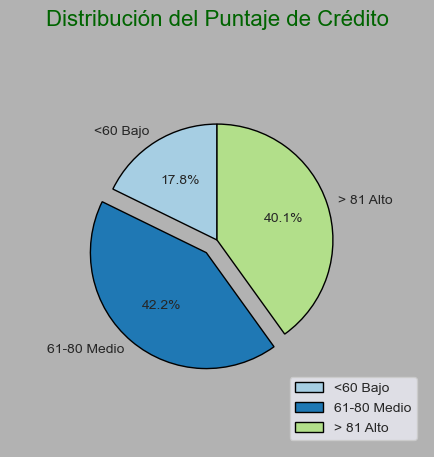

In [ ]:
# Asegurarse de que 'Scoring' es numérico
df['Scoring'] = pd.to_numeric(df['Scoring'], errors='coerce')

# Definir los intervalos
bins = [0, 59, 80, 100]
labels = ['<60 Bajo', '61-80 Medio', '> 81 Alto']
df['Scoring_bin'] = pd.cut(df['Scoring'], bins=bins, labels=labels, right=True, include_lowest=True)

# Contar los valores en cada intervalo
scoring_counts = df['Scoring_bin'].value_counts().sort_index()

# Configurar Seaborn
sns.set_style("dark")
colors = sns.color_palette("Paired", len(scoring_counts))

# Crear el gráfico de pastel
fig, ax = plt.subplots(figsize=(6, 6))
fig.set_facecolor('#b2b2b2')

wedges, texts, autotexts = ax.pie(
    scoring_counts,
    labels=scoring_counts.index,
    radius=0.7,
    startangle=90,
    explode=[0.1 if i == scoring_counts.idxmax() else 0 for i in scoring_counts.index],  # Explode the largest slice
    autopct='%1.1f%%',
    colors=colors,
    wedgeprops={'edgecolor': 'k'}
)

# Añadir una leyenda debajo del gráfico
plt.legend(wedges, scoring_counts.index, title="Intervalos de Scoring", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Personalizar el gráfico
plt.title('Distribución del Puntaje de Crédito', color='darkgreen', fontsize=16, pad=5)  # Ajustar pad para reducir la distancia
plt.legend(loc='lower right', labels=labels, fontsize=10)
plt.subplots_adjust(top=0.8, hspace=2)
# Mostrar los gráficos
plt.show()

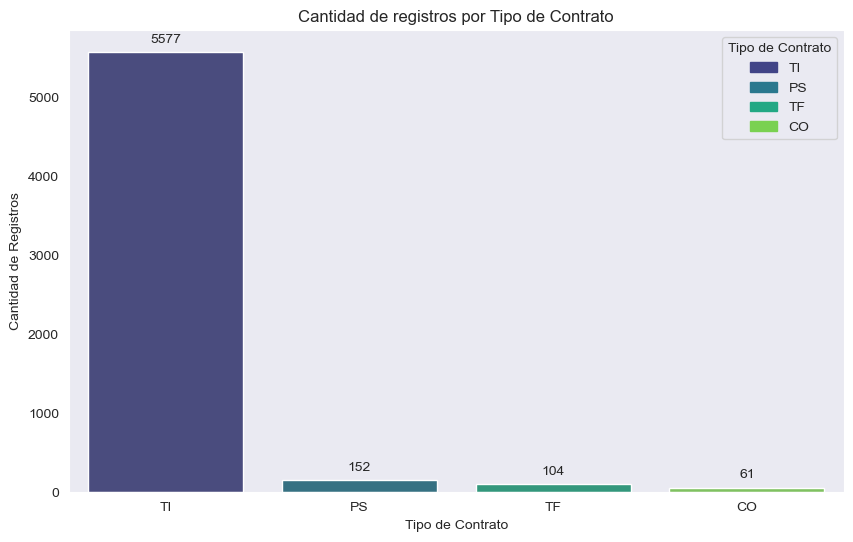

In [ ]:
# Calcular la cantidad total de registros por tipo de contrato
tipo_contrato_counts = df['tipo_contrato'].value_counts()

# Crear una lista de colores y asignarla a cada tipo de contrato
palette = sns.color_palette("viridis", len(tipo_contrato_counts))
colors = dict(zip(tipo_contrato_counts.index, palette))

# Graficar la cantidad total de registros por tipo de contrato
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=tipo_contrato_counts.index, y=tipo_contrato_counts.values, palette=palette)
plt.title('Cantidad de registros por Tipo de Contrato')
plt.xlabel('Tipo de Contrato')
plt.ylabel('Cantidad de Registros')


# Agregar etiquetas a cada barra
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 9),  # Desplazamiento de la etiqueta
                textcoords='offset points')

# Crear una leyenda con descripciones para cada color
handles = [plt.Rectangle((0,0),1,1, color=colors[state]) for state in colors]
labels = [state for state in colors]
plt.legend(handles, labels, title="Tipo de Contrato")

plt.show()


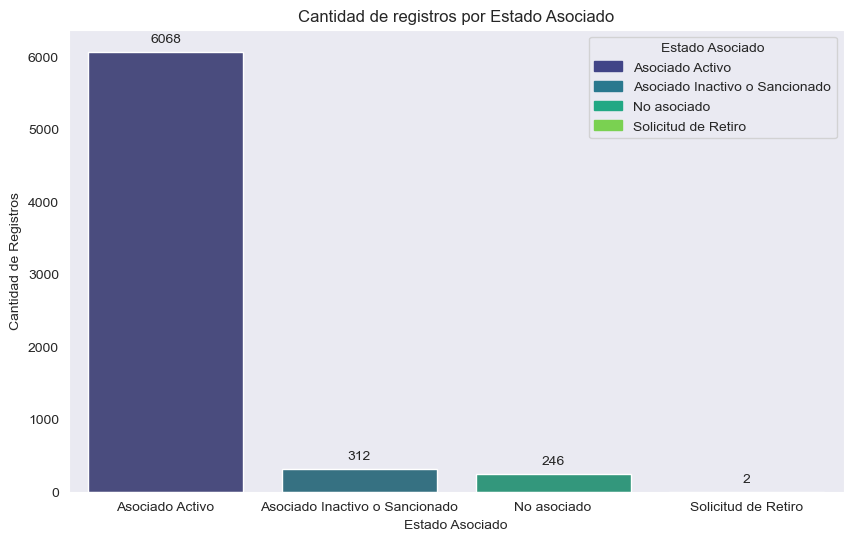

In [ ]:
# Calcular la cantidad total de registros por tipo de contrato
tipo_contrato_counts = df['Estado'].value_counts()

# Crear una lista de colores y asignarla a cada tipo de contrato
palette = sns.color_palette("viridis", len(tipo_contrato_counts))
colors = dict(zip(tipo_contrato_counts.index, palette))

# Graficar la cantidad total de registros por tipo de contrato
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=tipo_contrato_counts.index, y=tipo_contrato_counts.values, palette=palette)
plt.title('Cantidad de registros por Estado Asociado')
plt.xlabel('Estado Asociado')
plt.ylabel('Cantidad de Registros')


# Agregar etiquetas a cada barra
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center',
                xytext = (0, 9),  # Desplazamiento de la etiqueta
                textcoords = 'offset points')

# Crear una leyenda con descripciones para cada color
handles = [plt.Rectangle((0,0),1,1, color=colors[state]) for state in colors]
labels = [state for state in colors]
plt.legend(handles, labels, title="Estado Asociado")

plt.show()


In [ ]:
# Creamos una función para ver en detalle los datos de cada variable

def detallar_columnas(df, columna):

    print(f"Variable: ", columna,
          "\nFormato: ", df[columna].dtype,
          "\nCantidad de valores nulos: ", df[columna].isnull().sum(),
          "\nValores únicos: ", df[columna].nunique(),
          "\nDistribución de los valores: \n", df[columna].value_counts())

# Variables Scoring Actual

## Solvencia vs Scoring

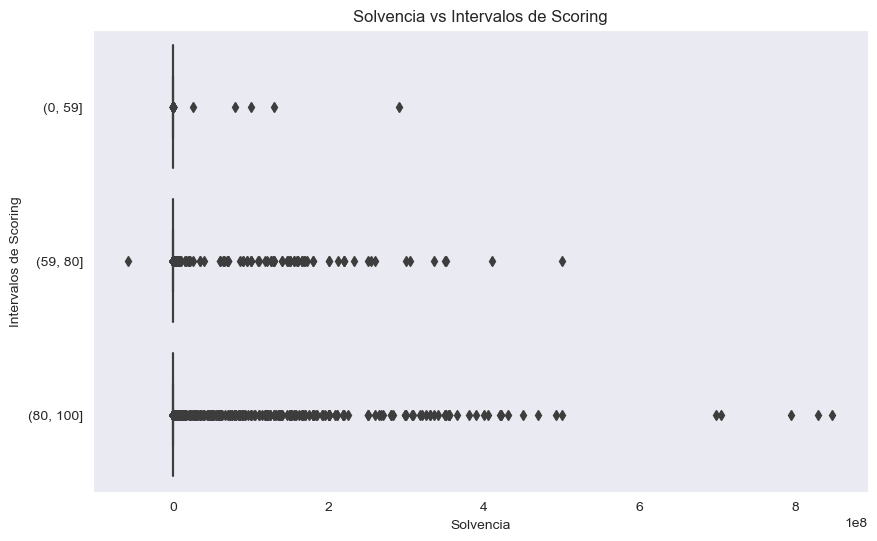

In [ ]:
# Función para ver en detalle las variables
def detallar_columnas(df, columna):
    print("Información detallada de la columna:", columna)
    print(df[columna].describe())
    print("\nValores únicos y su conteo:")
    print(df[columna].value_counts())

# Supongamos que df ya está definido y contiene las columnas necesarias
# Definir los intervalos
bins = [0, 59, 80, 100]

# Utilizamos la función para ver en detalle las variables
# detallar_columnas(df, '# Veces SMLV')
# print('\n', '-'*79, '\n')
# detallar_columnas(df, 'Scoring')
# print('\n', '-'*79, '\n')

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Graficar los datos de la variable '# Veces SMLV' agrupados por intervalos de 'Scoring'
plt.figure(figsize=(10, 6))
sns.boxplot(y='Scoring_interval', x='Solvencia', data=df)
plt.title('Solvencia vs Intervalos de Scoring')
plt.ylabel('Intervalos de Scoring')
plt.xlabel('Solvencia')
plt.show()

## Deuda vs Ingreso

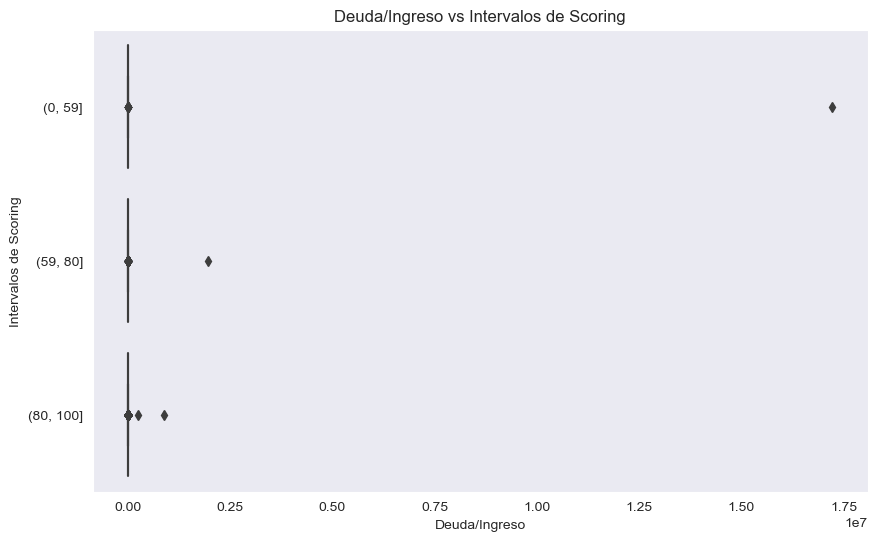

In [ ]:
# Función para ver en detalle las variables
def detallar_columnas(df, columna):
    print("Información detallada de la columna:", columna)
    print(df[columna].describe())
    print("\nValores únicos y su conteo:")
    print(df[columna].value_counts())

# Supongamos que df ya está definido y contiene las columnas necesarias
# Definir los intervalos
bins = [0, 59, 80, 100]

# Utilizamos la función para ver en detalle las variables
# detallar_columnas(df, '# Veces SMLV')
# print('\n', '-'*79, '\n')
# detallar_columnas(df, 'Scoring')
# print('\n', '-'*79, '\n')

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Graficar los datos de la variable '# Veces SMLV' agrupados por intervalos de 'Scoring'
plt.figure(figsize=(10, 6))
sns.boxplot(y='Scoring_interval', x='Deuda / Ingreso', data=df)
plt.title('Deuda/Ingreso vs Intervalos de Scoring')
plt.ylabel('Intervalos de Scoring')
plt.xlabel('Deuda/Ingreso')
plt.show()

## Antiguedad en años

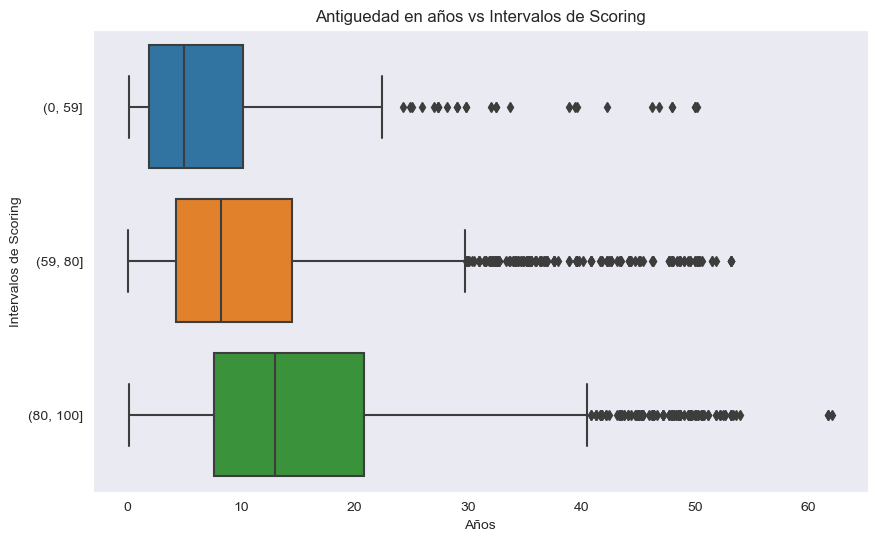

In [ ]:
# Función para ver en detalle las variables
def detallar_columnas(df, columna):
    print("Información detallada de la columna:", columna)
    print(df[columna].describe())
    print("\nValores únicos y su conteo:")
    print(df[columna].value_counts())

# Supongamos que df ya está definido y contiene las columnas necesarias
# Definir los intervalos
bins = [0, 59, 80, 100]

# Utilizamos la función para ver en detalle las variables
# detallar_columnas(df, '# Veces SMLV')
# print('\n', '-'*79, '\n')
# detallar_columnas(df, 'Scoring')
# print('\n', '-'*79, '\n')

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Graficar los datos de la variable '# Veces SMLV' agrupados por intervalos de 'Scoring'
plt.figure(figsize=(10, 6))
sns.boxplot(y='Scoring_interval', x='Antigüedad Años', data=df)
plt.title('Antiguedad en años vs Intervalos de Scoring')
plt.ylabel('Intervalos de Scoring')
plt.xlabel('Años')
plt.show()

## Medio de pago vs Scoring

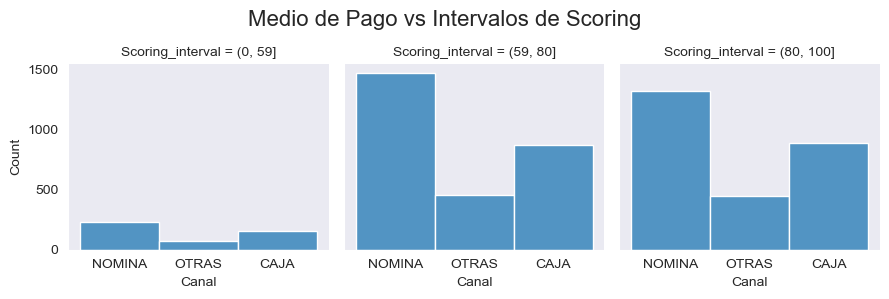

In [ ]:
def detallar_columnas(df, columna):
    print("Información detallada de la columna:", columna)
    print(df[columna].describe())
    print("\nValores únicos y su conteo:")
    print(df[columna].value_counts())

# Definir los intervalos
bins = [0, 59, 80, 100]

# Ejemplo de cómo sería el dataframe 'df'
# df = pd.DataFrame({'Scoring': [20, 40, 70, 85, 95, 55, 75, 65],
#                    'personas_acargo': [1, 2, 3, 1, 2, 4, 1, 3]})

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Graficar los datos de la variable ' # Veces SMLV' agrupados por intervalos de 'Scoring'
figura3 = sns.FacetGrid(df, col='Scoring_interval')
figura3.map(sns.histplot, 'Canal')

# Ajustar el espacio para el título y las leyendas
plt.subplots_adjust(top=0.8, hspace=2)  # hspace ajusta el espacio vertical entre los subplots
figura3.fig.suptitle('Medio de Pago vs Intervalos de Scoring', fontsize=16)

# Mostrar el gráfico
plt.show()

### Relación Intervalos del Scoring vs # de Veces el SMLV

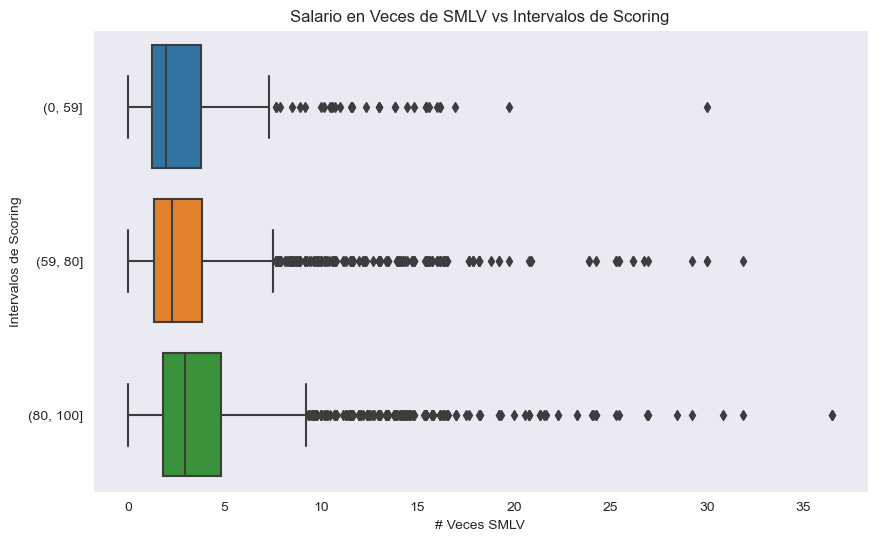

In [ ]:
# Función para ver en detalle las variables
def detallar_columnas(df, columna):
    print("Información detallada de la columna:", columna)
    print(df[columna].describe())
    print("\nValores únicos y su conteo:")
    print(df[columna].value_counts())

# Supongamos que df ya está definido y contiene las columnas necesarias
# Definir los intervalos
bins = [0, 59, 80, 100]

# Utilizamos la función para ver en detalle las variables
# detallar_columnas(df, '# Veces SMLV')
# print('\n', '-'*79, '\n')
# detallar_columnas(df, 'Scoring')
# print('\n', '-'*79, '\n')

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Graficar los datos de la variable '# Veces SMLV' agrupados por intervalos de 'Scoring'
plt.figure(figsize=(10, 6))
sns.boxplot(y='Scoring_interval', x='# Veces SMLV', data=df)
plt.title('Salario en Veces de SMLV vs Intervalos de Scoring')
plt.ylabel('Intervalos de Scoring')
plt.xlabel('# Veces SMLV')
plt.show()


## Relación Scoring vs Estrato Asociado

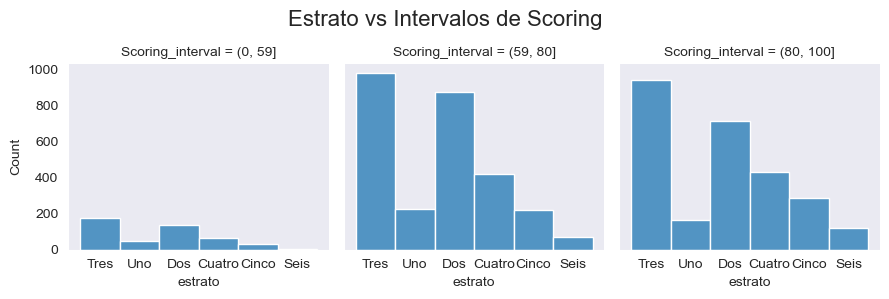

In [ ]:
def detallar_columnas(df, columna):
    print("Información detallada de la columna:", columna)
    print(df[columna].describe())
    print("\nValores únicos y su conteo:")
    print(df[columna].value_counts())

# Definir los intervalos
bins = [0, 59, 80, 100]

# Ejemplo de cómo sería el dataframe 'df'
# df = pd.DataFrame({'Scoring': [20, 40, 70, 85, 95, 55, 75, 65],
#                    'personas_acargo': [1, 2, 3, 1, 2, 4, 1, 3]})

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Graficar los datos de la variable ' # Veces SMLV' agrupados por intervalos de 'Scoring'
figura3 = sns.FacetGrid(df, col='Scoring_interval')
figura3.map(sns.histplot, 'estrato')

# Ajustar el espacio para el título y las leyendas
plt.subplots_adjust(top=0.8, hspace=2)  # hspace ajusta el espacio vertical entre los subplots
figura3.fig.suptitle('Estrato vs Intervalos de Scoring', fontsize=16)

# Mostrar el gráfico
plt.show()

### Relación Scoring vs número de personas a cargo

C:\Users\alejo\AppData\Local\Temp\ipykernel_13012\3804454588.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


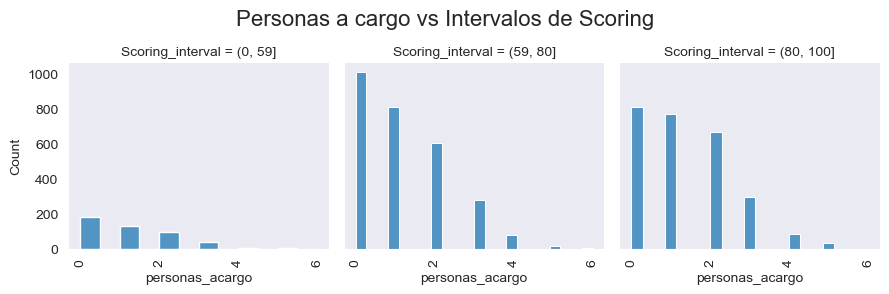

In [ ]:
def detallar_columnas(df, columna):
    print("Información detallada de la columna:", columna)
    print(df[columna].describe())
    print("\nValores únicos y su conteo:")
    print(df[columna].value_counts())

# Definir los intervalos
bins = [0, 59, 80, 100]

# Ejemplo de cómo sería el dataframe 'df'
# df = pd.DataFrame({'Scoring': [20, 40, 70, 85, 95, 55, 75, 65],
#                    'personas_acargo': [1, 2, 3, 1, 2, 4, 1, 3]})

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Graficar los datos de la variable ' # Veces SMLV' agrupados por intervalos de 'Scoring'
figura3 = sns.FacetGrid(df, col='Scoring_interval')
figura3.map(sns.histplot, 'personas_acargo')
for ax in figura3.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# Ajustar el espacio para el título y las leyendas
plt.subplots_adjust(top=0.8, hspace=2)  # hspace ajusta el espacio vertical entre los subplots
figura3.fig.suptitle('Personas a cargo vs Intervalos de Scoring', fontsize=16)

# Mostrar el gráfico
plt.show()


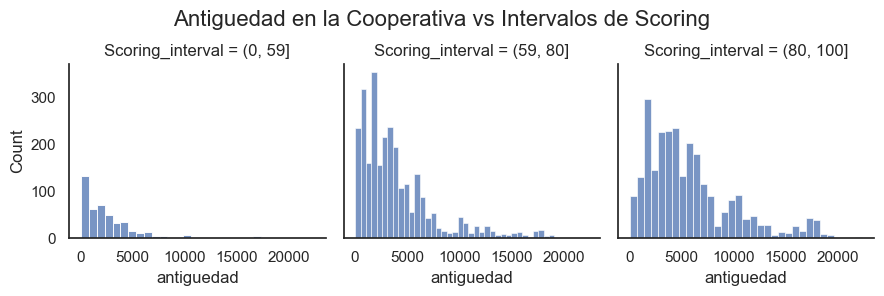

In [ ]:
# Definir los intervalos
bins = [0, 59, 80, 100]

# Ejemplo de cómo sería el dataframe 'df'
# df = pd.DataFrame({'Scoring': [20, 40, 70, 85, 95, 55, 75, 65],
#                    'personas_acargo': [1, 2, 3, 1, 2, 4, 1, 3]})

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Graficar los datos de la variable ' # Veces SMLV' agrupados por intervalos de 'Scoring'
figura3 = sns.FacetGrid(df, col='Scoring_interval')
figura3.map(sns.histplot, 'antiguedad')

# Ajustar el espacio para el título y las leyendas
plt.subplots_adjust(top=0.8, hspace=2)  # hspace ajusta el espacio vertical entre los subplots
figura3.fig.suptitle('Antiguedad en la Cooperativa vs Intervalos de Scoring', fontsize=16)

# Mostrar el gráfico
plt.show()


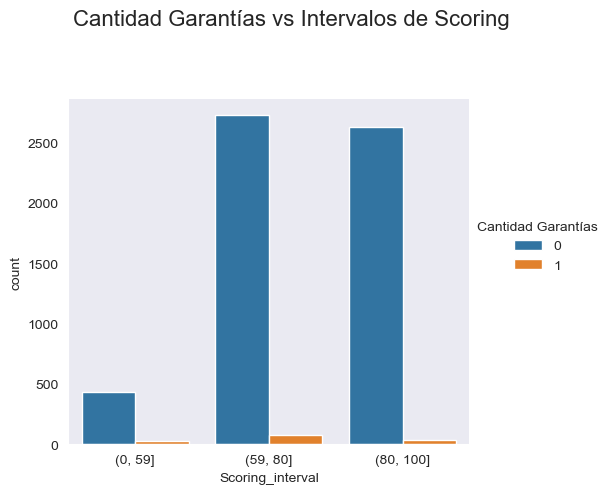

In [ ]:
def detallar_columnas(df, columna):
    print("Información detallada de la columna:", columna)
    print(df[columna].describe())
    print("\nValores únicos y su conteo:")
    print(df[columna].value_counts())

# Definir los intervalos
bins = [0, 59, 80, 100]

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Graficar los datos de la variable dummy 'Cantidad Garantías' agrupados por intervalos de 'Scoring'
figura3 = sns.catplot(data=df, x='Scoring_interval', hue='Cantidad Garantías', kind='count')

# Ajustar el espacio para el título y las leyendas
plt.subplots_adjust(top=0.8)  # hspace ajusta el espacio vertical entre los subplots
figura3.fig.suptitle('Cantidad Garantías vs Intervalos de Scoring', fontsize=16)

# Mostrar el gráfico
plt.show()


### Relación Scoring vs edad

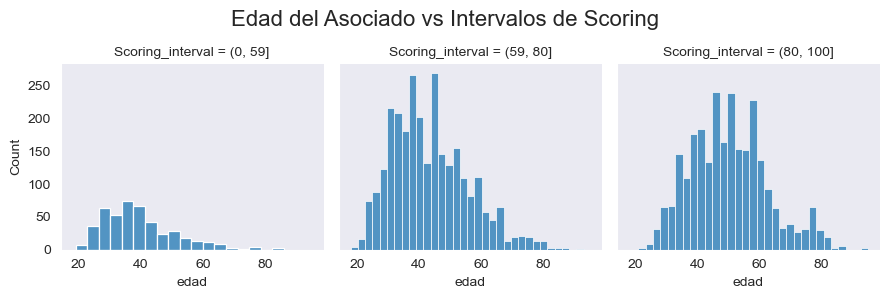

In [ ]:
def detallar_columnas(df, columna):
    print("Información detallada de la columna:", columna)
    print(df[columna].describe())
    print("\nValores únicos y su conteo:")
    print(df[columna].value_counts())

# Definir los intervalos
bins = [0, 59, 80, 100]

# Utilizamos la función para ver en detalle las variables
#detallar_columnas(df, '# Veces SMLV')
#print('\n', '-'*79, '\n')
#detallar_columnas(df, 'Scoring')
#print('\n', '-'*79, '\n')

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Graficar los datos de la variable ' # Veces SMLV' agrupados por intervalos de 'Scoring'
figura3 = sns.FacetGrid(df, col='Scoring_interval')
figura3.map(sns.histplot, 'edad')

# Ajustar el espacio para el título y las leyendas
plt.subplots_adjust(top=0.8, hspace=2)  # hspace ajusta el espacio vertical entre los subplots
figura3.fig.suptitle('Edad del Asociado vs Intervalos de Scoring', fontsize=16)

# Mostrar el gráfico
plt.show()

### Relación Scoring vs nivel educativo

C:\Users\alejo\AppData\Local\Temp\ipykernel_13012\602576598.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


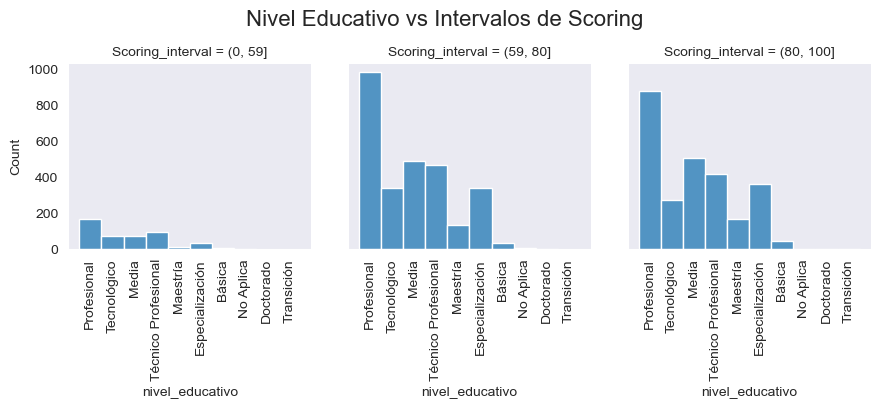

In [ ]:
# Suponiendo que ya tienes definida la función detallar_columnas

# Definir los intervalos
bins = [0, 59, 80, 100]

# Utilizamos la función para ver en detalle las variables
# detallar_columnas(df, '# Veces SMLV')
# print('\n', '-'*79, '\n')
# detallar_columnas(df, 'Scoring')
# print('\n', '-'*79, '\n')

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Graficar los datos de la variable '# Veces SMLV' agrupados por intervalos de 'Scoring'
figura3 = sns.FacetGrid(df, col='Scoring_interval')
figura3.map(sns.histplot, 'nivel_educativo')

# Rotar las etiquetas del eje x a 90 grados
for ax in figura3.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# Ajustar el espacio para el título y las leyendas
plt.subplots_adjust(top=0.8, hspace=2)  # hspace ajusta el espacio vertical entre los subplots
figura3.fig.suptitle('Nivel Educativo vs Intervalos de Scoring', fontsize=16)

# Mostrar el gráfico
plt.show()


### Relación Scoring vs Tipo de Vivienda

C:\Users\alejo\AppData\Local\Temp\ipykernel_13012\3701731352.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


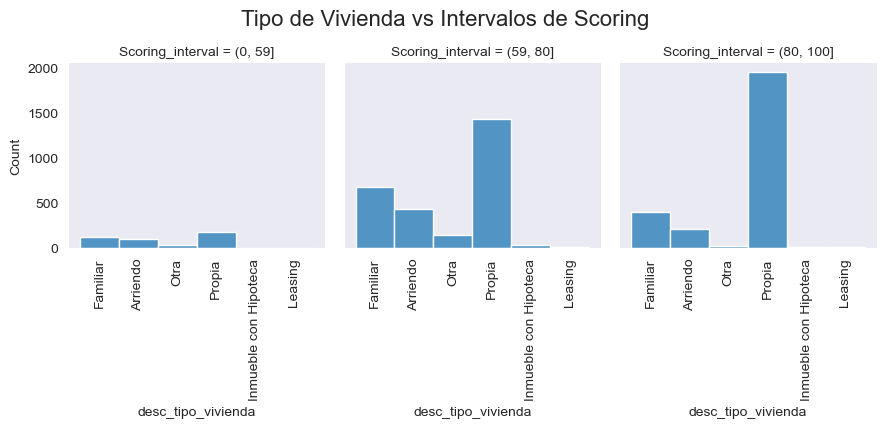

In [ ]:
# Suponiendo que ya tienes definida la función detallar_columnas

# Definir los intervalos
bins = [0, 59, 80, 100]

# Utilizamos la función para ver en detalle las variables
# detallar_columnas(df, '# Veces SMLV')
# print('\n', '-'*79, '\n')
# detallar_columnas(df, 'Scoring')
# print('\n', '-'*79, '\n')

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Graficar los datos de la variable '# Veces SMLV' agrupados por intervalos de 'Scoring'
figura3 = sns.FacetGrid(df, col='Scoring_interval')
figura3.map(sns.histplot, 'desc_tipo_vivienda')

# Rotar las etiquetas del eje x a 90 grados
for ax in figura3.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# Ajustar el espacio para el título y las leyendas
plt.subplots_adjust(top=0.8, hspace=2)  # hspace ajusta el espacio vertical entre los subplots
figura3.fig.suptitle('Tipo de Vivienda vs Intervalos de Scoring', fontsize=16)

# Mostrar el gráfico
plt.show()

## Relación Scoring vs Estado Civil

C:\Users\alejo\AppData\Local\Temp\ipykernel_13012\523520092.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


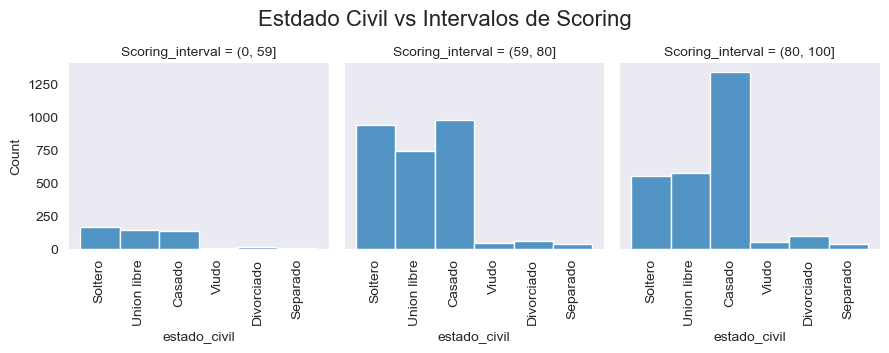

In [ ]:
# Suponiendo que ya tienes definida la función detallar_columnas

# Definir los intervalos
bins = [0, 59, 80, 100]

# Utilizamos la función para ver en detalle las variables
# detallar_columnas(df, '# Veces SMLV')
# print('\n', '-'*79, '\n')
# detallar_columnas(df, 'Scoring')
# print('\n', '-'*79, '\n')

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Graficar los datos de la variable '# Veces SMLV' agrupados por intervalos de 'Scoring'
figura3 = sns.FacetGrid(df, col='Scoring_interval')
figura3.map(sns.histplot, 'estado_civil')

# Rotar las etiquetas del eje x a 90 grados
for ax in figura3.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# Ajustar el espacio para el título y las leyendas
plt.subplots_adjust(top=0.8, hspace=2)  # hspace ajusta el espacio vertical entre los subplots
figura3.fig.suptitle('Estdado Civil vs Intervalos de Scoring', fontsize=16)

# Mostrar el gráfico
plt.show()

C:\Users\alejo\AppData\Local\Temp\ipykernel_13012\164396559.py:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')  # Rotar etiquetas a 45 grados


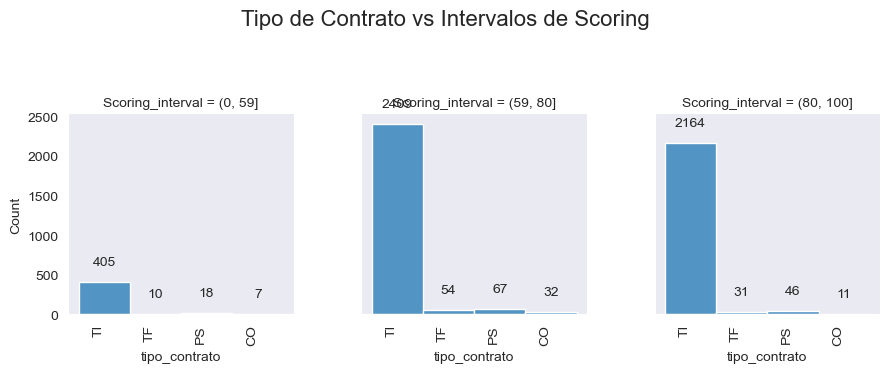

In [ ]:
def detallar_columnas(df, columna):
    print("Información detallada de la columna:", columna)
    print(df[columna].describe())
    print("\nValores únicos y su conteo:")
    print(df[columna].value_counts())

# Supongamos que df ya está definido y contiene las columnas necesarias
# Definir los intervalos
bins = [0, 59, 80, 100]

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Función para añadir etiquetas a las barras del histograma
def add_labels(ax):
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height:.0f}',
                    xy=(p.get_x() + p.get_width() / 2, height),
                    xytext=(0, 10),  # Ajustar desplazamiento vertical
                    textcoords="offset points",
                    ha='center', va='bottom')

# Graficar los datos de la variable 'tipo_contrato' agrupados por intervalos de 'Scoring'
figura3 = sns.FacetGrid(df, col='Scoring_interval')
figura3.map(sns.histplot, 'tipo_contrato')

# Rotar las etiquetas del eje x a 90 grados y añadir etiquetas en cada barra
for ax in figura3.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')  # Rotar etiquetas a 45 grados
    add_labels(ax)

# Ajustar el espacio para el título y las leyendas
plt.subplots_adjust(top=0.85, hspace=0.4, wspace=0.3)  # Ajustar espacio vertical y horizontal entre subplots
figura3.fig.suptitle('Tipo de Contrato vs Intervalos de Scoring', fontsize=16, y=1.2)  # Ajustar la posición vertical del título

# Mostrar el gráfico
plt.show()

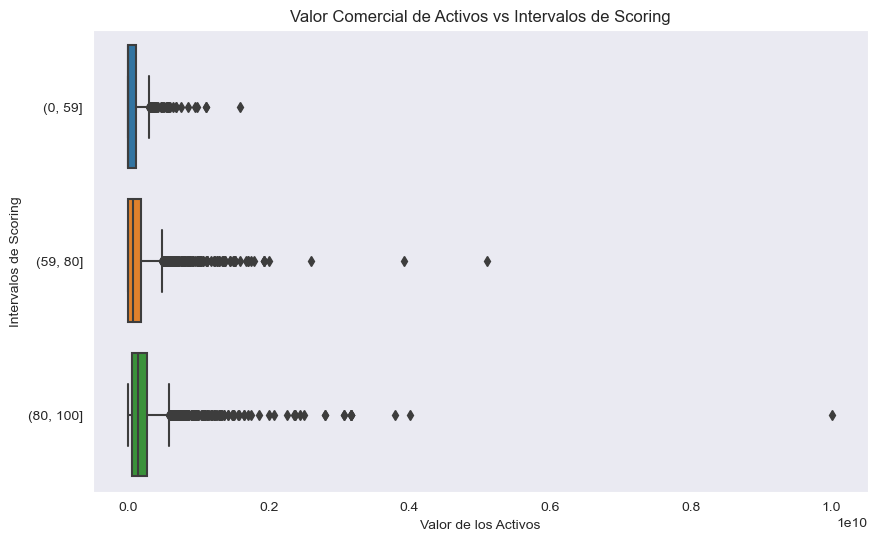

In [ ]:
# Función para ver en detalle las variables
def detallar_columnas(df, columna):
    print("Información detallada de la columna:", columna)
    print(df[columna].describe())
    print("\nValores únicos y su conteo:")
    print(df[columna].value_counts())

# Supongamos que df ya está definido y contiene las columnas necesarias
# Definir los intervalos
bins = [0, 59, 80, 100]

# Utilizamos la función para ver en detalle las variables
# detallar_columnas(df, '# Veces SMLV')
# print('\n', '-'*79, '\n')
# detallar_columnas(df, 'Scoring')
# print('\n', '-'*79, '\n')

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Graficar los datos de la variable '# Veces SMLV' agrupados por intervalos de 'Scoring'
plt.figure(figsize=(10, 6))
sns.boxplot(y='Scoring_interval', x='Valor comercial activos', data=df)
plt.title('Valor Comercial de Activos vs Intervalos de Scoring')
plt.ylabel('Intervalos de Scoring')
plt.xlabel('Valor de los Activos')
plt.show()

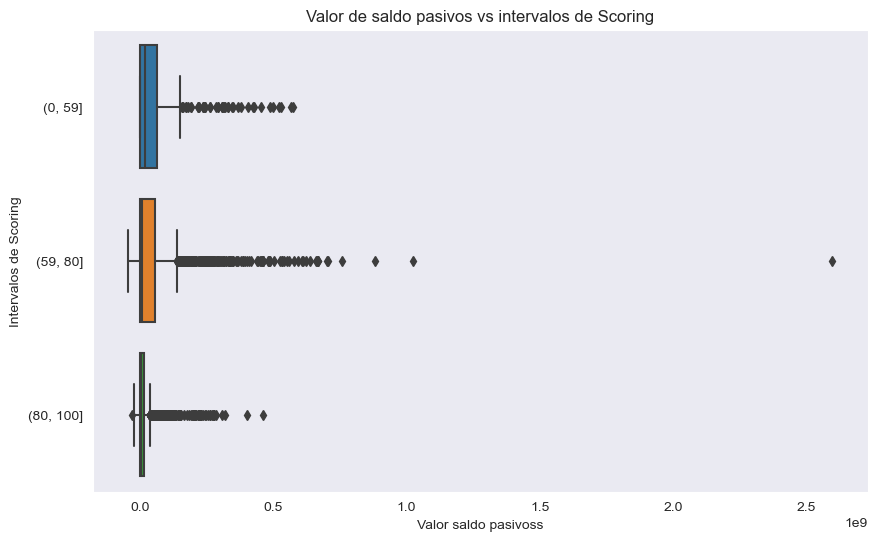

In [ ]:
# Función para ver en detalle las variables
def detallar_columnas(df, columna):
    print("Información detallada de la columna:", columna)
    print(df[columna].describe())
    print("\nValores únicos y su conteo:")
    print(df[columna].value_counts())

# Supongamos que df ya está definido y contiene las columnas necesarias
# Definir los intervalos
bins = [0, 59, 80, 100]

# Utilizamos la función para ver en detalle las variables
# detallar_columnas(df, '# Veces SMLV')
# print('\n', '-'*79, '\n')
# detallar_columnas(df, 'Scoring')
# print('\n', '-'*79, '\n')

# Agrupar 'Scoring' en intervalos definidos por los bins
df['Scoring_interval'] = pd.cut(df['Scoring'], bins=bins)

# Graficar los datos de la variable '# Veces SMLV' agrupados por intervalos de 'Scoring'
plt.figure(figsize=(10, 6))
sns.boxplot(y='Scoring_interval', x='Valor saldo pasivos', data=df)
plt.title('Valor de saldo pasivos vs intervalos de Scoring')
plt.ylabel('Intervalos de Scoring')
plt.xlabel('Valor saldo pasivoss')
plt.show()

In [ ]:
import pandas as pd

# Supongamos que df ya está definido y contiene la columna 'Dias Vencidos'
# Crear los intervalos y las etiquetas
bins = [0, 1, 30, 60, 90, 120, 150, 180, 1000, float('inf')]
labels = ['B0', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'BCASTIGO']

# Crear la nueva columna 'tipobucket' basada en los 'Dias Vencidos'
df['tipobucket'] = pd.cut(df['Dias Vencidos'], bins=bins, labels=labels, right=False, include_lowest=True)

# Mostrar el DataFrame con la nueva columna
df.head(3)


,Suc. Cliente,Estado,Medio de pago,cod empleado,Fec. Ult Afili,Fec. Ult retiro,Fec. nacimi,edad,seccion,Tipo de asociado,Sueldo,# Veces SMLV,Cod Ubica1,Nom Ubica1,Cod Ubica2,Nom Ubica2,Cod Depend,Nom Depend,Dirección Correspondencia,Ciudad Correspondencia,Departamento,Telefono,Fax,correo Electronico,Fech.Ult.Act.Datos,Tipo Docum.Id,Desc.Tip.Doc,Sexo,antiguedad,estado_civil,nro_hijos,personas_acargo,estrato,nivel_educativo,valor_ingreso_mensual,valor_egreso_mensual,declara_renta,tipo_contrato,desc_tipo_vivienda,APORTES ORDINARIOS,AHORRO PERMANENTE,CAPITALIZACION DE APORTES,APORTES POR CUOTA DE AFILIACION,AHORRO PLAN FUTURO 0.5%,Sld Aportes,Tipo Obl.,No. Obligación,Monto Solicitado,Saldo Capital,Sld Int,Sld Mora,Dias Vencidos,Venc.Capital,Tasa Col.(NAMV),Tasa Peridodo(NAMV),Clasificacion,Linea de credito,Destinacion,Modalidad,Medio de pago Obligación,Tipo Garantia,Vlr Garantia,Vlr.Cobertura Disponible,Vlr Prov.Capital,Vlr. Prov.Interes,Vlr Aportes Util. en la Provision,Fec.Aprobacion,Fec. Prestamo,Fec.Liquidacion,Vlr Cuota,No.Cuotas,Periodicidad,Fec Inicio,Fec. Vcto Final,Altura,Fec Vencto,Calif.Antes Ley Arrast.,Calif. Aplicada,Calif.Mes Ant.,Int Cte Orden,Int Mora Orden,Fec.Historico,Sld Seg Vida,Sld Seg Patrimonial,Forma de Pago,Fec Ult.Pago,Cuenta Contable,Suc.Credito,Cód. Garantía,Cantidad Garantías,%Cobertura Garant.,Vlr.aplicado Garant.,Codeudores,Garantía Real,Pagare,C Costo Cli.,C Costo Obl,Dias vencidos Int,Instan.Aprob.,Vencido Int,Dias Vencidos Capital,Probabilidad de incumplimiento sistema,Probabilidad de incumplimiento manual,Perdida dado incumplimiento sistema,Perdida dado incumplimiento manual,Valor expuesto,valor perdida esperada aplicada,Valor comercial activos,Valor saldo pasivos,Scoring,Scoring Interval,Fecha Corte,Antigüedad Años,Solvencia,Deuda / Ingreso,Canal,Scoring_bin,Scoring_interval,tipobucket
0,2,Asociado Activo,019 - DISTRIBUIDORA Y EDITORA RICHMO,0.0,2012-01-20,NaN,1985-04-30,39,999 - ENVIO CUENTA COBRO INDIVIDUAL,3 - Empleado Emp. Vendida,5500000.0,4.230769,11001,BOGOTA,201,Carvajal Dorado,0,EDUCACTIVAS SAS,CR 111 No 152 D 11,"BOGOTA, D.C.",Distrito Capital,3133424997,NaN,janiys_29@hotmail.com,23-DEC-23,C,Cedula,F,4484,Union libre,2,3,Dos,Profesional,5500000.0,440000,Y,TI,Propia,7886181.0,117565,0,0,0,7886181,10,222001386,22000000,11827527,0,0,0,0,14.00,14.00,1 - Consumo,FI - FINANCIERO,LI0 - LIBRE INVERSION,820 - LIBRE INVERSION,019 - DISTRIBUIDORA Y EDITORA RICHMO,S - Personal con libranza,0.0,0,30150.0,0.0,1777370.76,2022-12-01,2022-12-01,2022-12-06,758893,21,Mensual,2024-02-29,2025-06-30,3,2024-01-31,A,A,A,0,0,NaN,0,0,N - Nomina,2024-04-30,14410501,2,NaN,0,NaN,0.0,SIN CODEUDORES,SIN GARANTIAS REALES,SC22200001653,999,999,0,NaN,0,0,0.004,NaN,0.75,NaN,10050156.24,30150,0.0,9211000,85,81-100,202404,12.455556,0.000000,1.674727,OTRAS,> 81 Alto,"(80, 100]",B0
1,2,Asociado Activo,019 - DISTRIBUIDORA Y EDITORA RICHMO,0.0,2012-01-20,NaN,1985-04-30,39,999 - ENVIO CUENTA COBRO INDIVIDUAL,3 - Empleado Emp. Vendida,5500000.0,4.230769,11001,BOGOTA,201,Carvajal Dorado,0,EDUCACTIVAS SAS,CR 111 No 152 D 11,"BOGOTA, D.C.",Distrito Capital,3133424997,NaN,janiys_29@hotmail.com,23-DEC-23,C,Cedula,F,4484,Union libre,2,3,Dos,Profesional,5500000.0,440000,Y,TI,Propia,7886181.0,117565,0,0,0,7886181,10,223000925,8473245,7722059,0,0,0,0,16.92,16.92,1 - Consumo,FI - FINANCIERO,CC0 - COMPRA DE CARTERA,1201 - PROMOCION COMPRA DE CARTERA,019 - DISTRIBUIDORA Y EDITORA RICHMO,S - Personal con libranza,0.0,0,19685.0,0.0,1160425.67,2023-08-02,2023-08-02,2023-08-08,213050,60,Mensual,2023-09-30,2028-08-31,8,2024-05-31,A,A,A,0,0,NaN,0,0,N - Nomina,2024-04-30,14410501,2,NaN,0,NaN,0.0,SIN CODEUDORES,SIN GARANTIAS REALES,SC23200001147,999,999,0,NaN,0,0,0.004,NaN,0.75,NaN,6561633.33,19685,175000000.0,105013000,80,60-80,202404,12.455556,1.666460,19.093273,OTRAS,61-80 Medio,"(59, 80]",B0
2,2,Asociado Activo,019 - DISTRIBUIDORA Y EDITORA RICHMO,0.0,2012-01-20,NaN,1985-04-30,39,999 - ENVIO CUENTA COBRO INDIVIDUAL,3 - Empleado Emp. Vendida,

### Tipo de Bucket
A continuación se realiza un análisis por tipo de bucket en función de su mora, versus el intervalo de scoring.

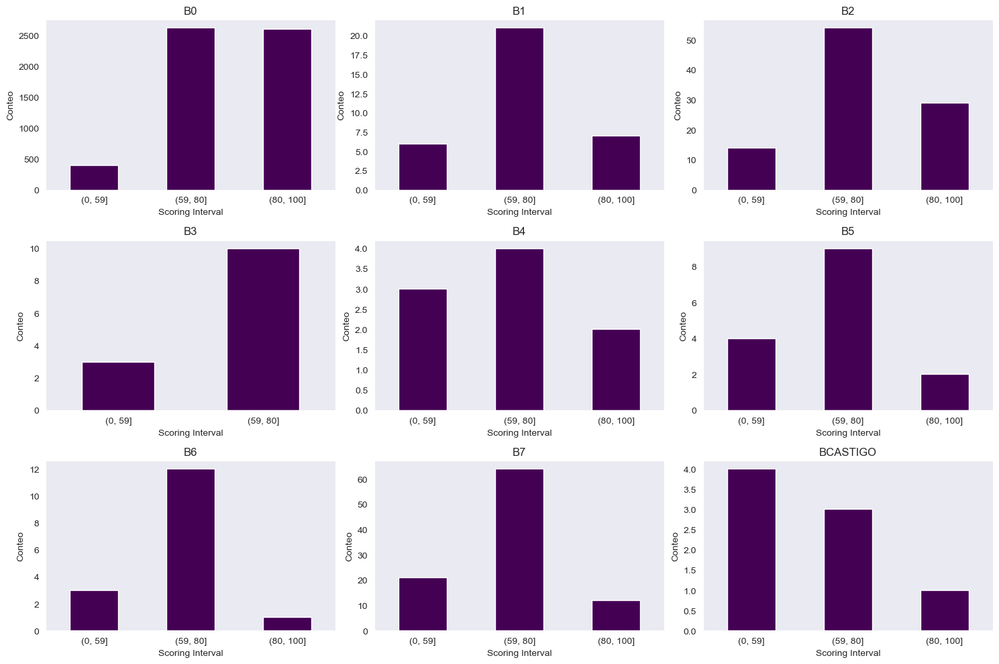

In [ ]:
# Orden deseado para los tipobucket
order = ['B0', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'BCASTIGO']

# Filtrar los tipobucket únicos para asegurar el orden deseado
tipobucket_unique = [tipobucket for tipobucket in order if tipobucket in df['tipobucket'].unique()]

# Calcular el número total de gráficos necesarios
num_plots = len(tipobucket_unique)

# Definir el número de filas y columnas para la disposición
num_rows = (num_plots // 3) + (1 if num_plots % 3 != 0 else 0)
num_cols = min(num_plots, 3)

# Crear una nueva figura y los subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

# Iterar sobre los tipobucket en el orden deseado y generar una gráfica para cada uno
for i, tipobucket in enumerate(tipobucket_unique):
    # Calcular la posición del subplot en la disposición de 3x3
    row_idx = i // 3
    col_idx = i % 3

    # Filtrar el DataFrame para el tipobucket actual
    tipobucket_df = df[df['tipobucket'] == tipobucket]

    # Crear una crosstab para el tipobucket actual
    crosstab = pd.crosstab(tipobucket_df['Scoring_interval'], columns='count')

    # Crear el gráfico de barras apiladas en el subplot correspondiente
    crosstab.plot(kind='bar', stacked=True, ax=axes[row_idx, col_idx], colormap='viridis')

    # Configuraciones del gráfico
    axes[row_idx, col_idx].set_title(f'{tipobucket}')
    axes[row_idx, col_idx].set_xlabel('Scoring Interval')
    axes[row_idx, col_idx].set_ylabel('Conteo')
    axes[row_idx, col_idx].legend().remove()  # Remover la leyenda para mayor claridad
    axes[row_idx, col_idx].tick_params(axis='x', rotation=0)

# Ajustar el espacio entre los subplots
plt.tight_layout()

# Mostrar los gráficos
plt.show()


C:\Users\alejo\AppData\Local\Temp\ipykernel_13012\1144091881.py:16: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_filtered = df_filtered.corr()


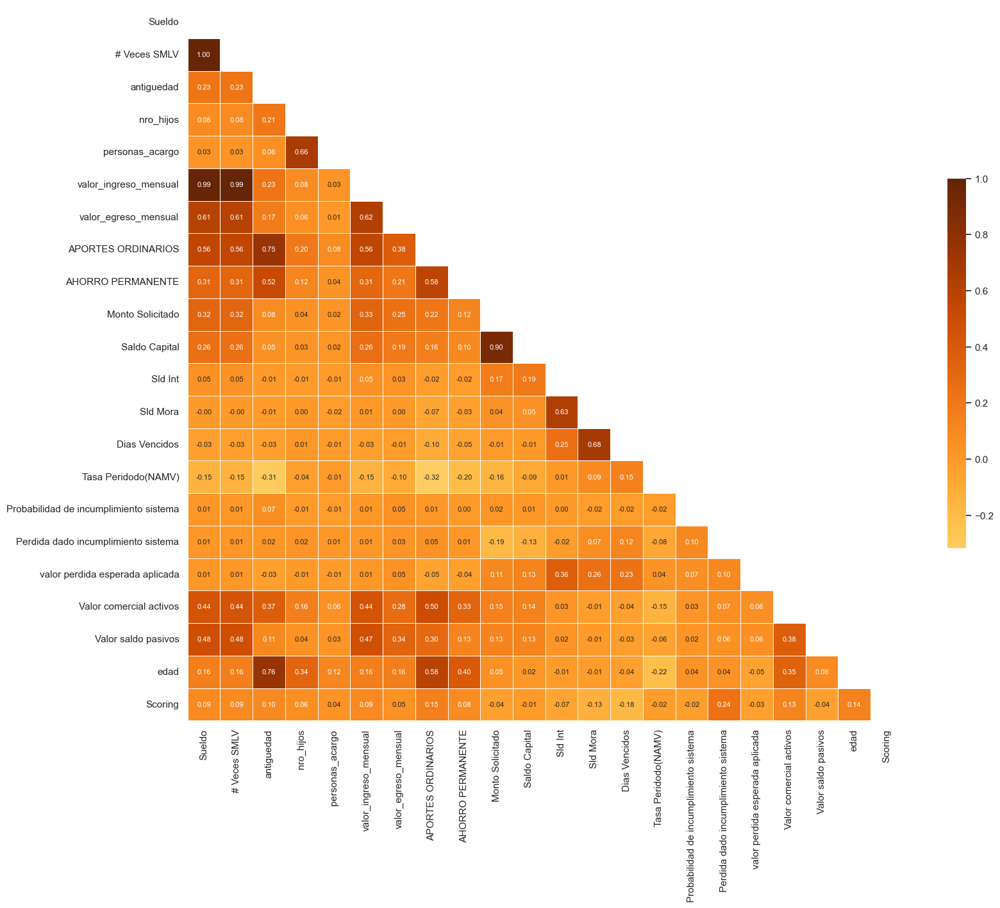

In [ ]:
# Filtrar el DataFrame para incluir solo las columnas de interés
columns_of_interest = [
    'Sueldo', '# Veces SMLV', 'antiguedad', 'estado_civil', 'nro_hijos',
    'personas_acargo', 'estrato', 'nivel_educativo', 'valor_ingreso_mensual',
    'valor_egreso_mensual', 'declara_renta', 'tipo_contrato', 'desc_tipo_vivienda',
    'APORTES ORDINARIOS', 'AHORRO PERMANENTE', 'Monto Solicitado', 'Saldo Capital',
    'Sld Int', 'Sld Mora', 'Dias Vencidos', 'Tasa Peridodo(NAMV)', 'Calif. Aplicada',
    'Probabilidad de incumplimiento sistema', 'Perdida dado incumplimiento sistema',
    'valor perdida esperada aplicada', 'Valor comercial activos', 'Valor saldo pasivos','edad',
    'Scoring', 'Scoring Interval']

# Filtrar el DataFrame para incluir solo las columnas de interés
df_filtered = df[columns_of_interest]

# Calcular la matriz de correlación para las columnas seleccionadas
corr_filtered = df_filtered.corr()

# Graficar el mapa de calor para ver la correlación entre las variables seleccionadas
sns.set_theme(style="white")
f, ax = plt.subplots(figsize=(18, 15))  # Aumentar el tamaño de la figura

# Crear una máscara para el triángulo superior
mask = np.triu(np.ones_like(corr_filtered, dtype=bool))

# Elegir una paleta de colores
cmap = sns.color_palette("YlOrBr", as_cmap=True)

# Dibujar el mapa de calor con la máscara y la correcta relación de aspectos
sns.heatmap(corr_filtered, mask=mask, cmap=cmap, annot=True, annot_kws={'size': 8}, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, fmt='.2f')

plt.show()


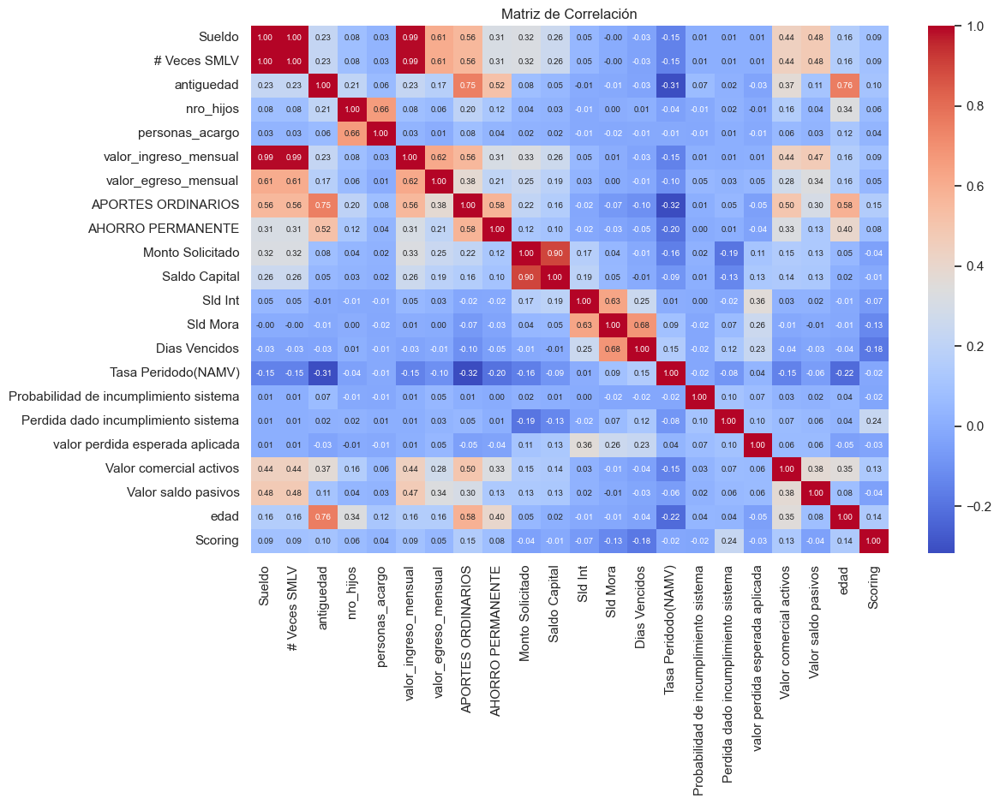

In [ ]:
### Visto el mapa de calor de otra manera:

# Generar el mapa de calor de la matriz de correlación
plt.figure(figsize=(12, 8))
sns.heatmap(corr_filtered, annot=True, cmap="coolwarm", annot_kws={'size': 7}, fmt='.2f')
plt.title("Matriz de Correlación")
plt.show()

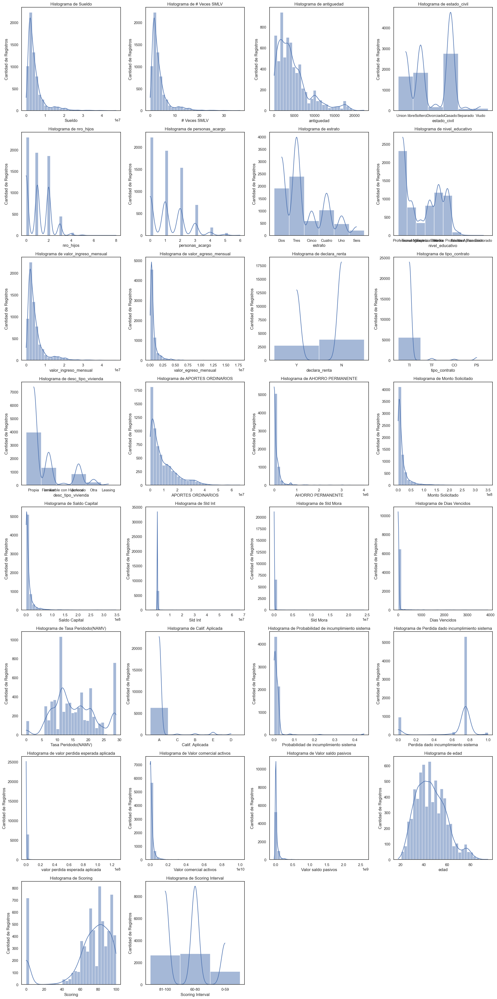

In [ ]:
# Definir el número de columnas para la visualización de los histogramas
num_columns = 4
num_plots = len(columns_of_interest)
num_rows = (num_plots + num_columns - 1) // num_columns  # Calcular el número de filas necesario

# Crear la figura y los ejes
fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, 5 * num_rows))

# Aplanar la matriz de ejes para facilitar la iteración
axes = axes.flatten()

# Graficar los histogramas para cada variable
for i, column in enumerate(columns_of_interest):
    sns.histplot(df[column], bins=30, kde=True, ax=axes[i])
    axes[i].set_title(f'Histograma de {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Cantidad de Registros')

# Eliminar cualquier eje restante sin gráficos
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


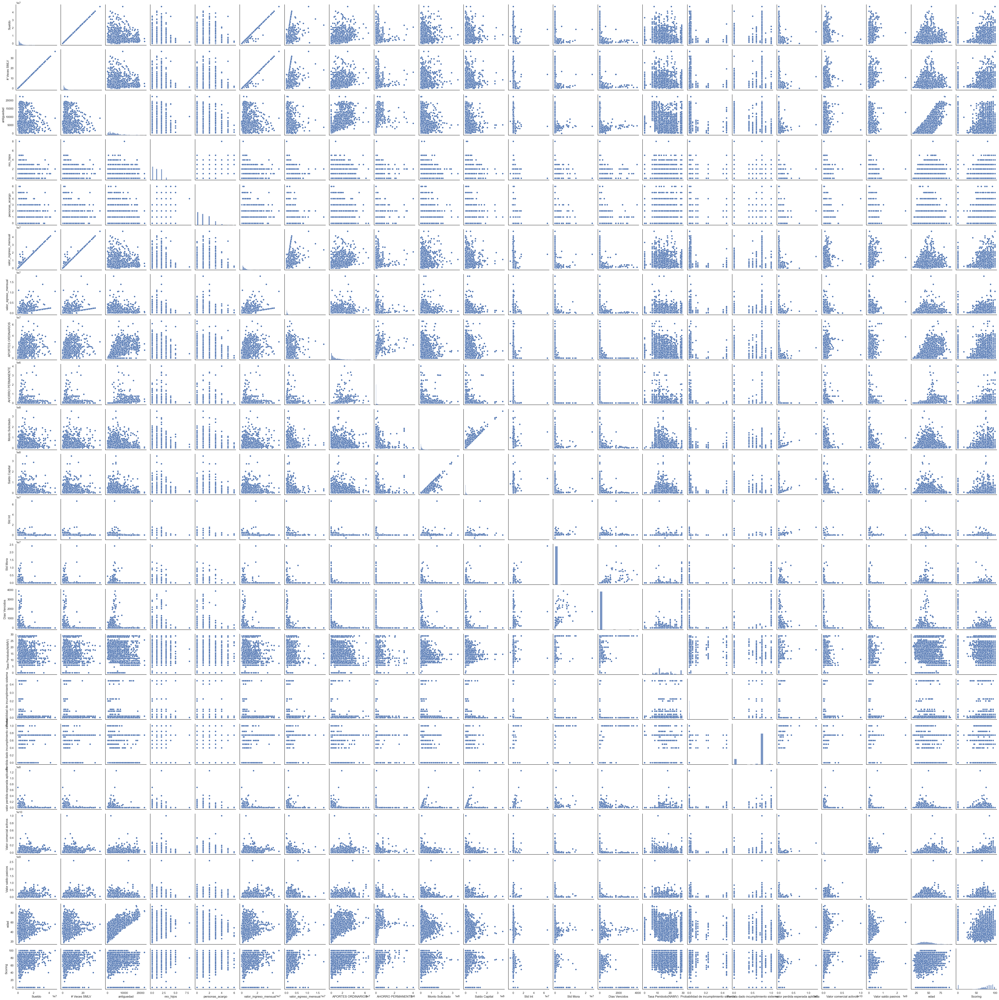

In [ ]:
sns.pairplot(df_filtered)

## Feature Importance

Realizamos una selección de las variables más relevantes del dataset, a partir de la correlación de la variable dependiente "Scoring" vs las demas, adicionalmente se realizó puntuación de cada variable en su incidencia a la dependiente a partir del criterio experto de acuerdo con el conocimiento del negocio. Esto dio como resultado, la selección de 33 variables.

C:\Users\alejo\AppData\Local\Temp\ipykernel_13012\2693033215.py:17: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_importance = df_importance.corr()


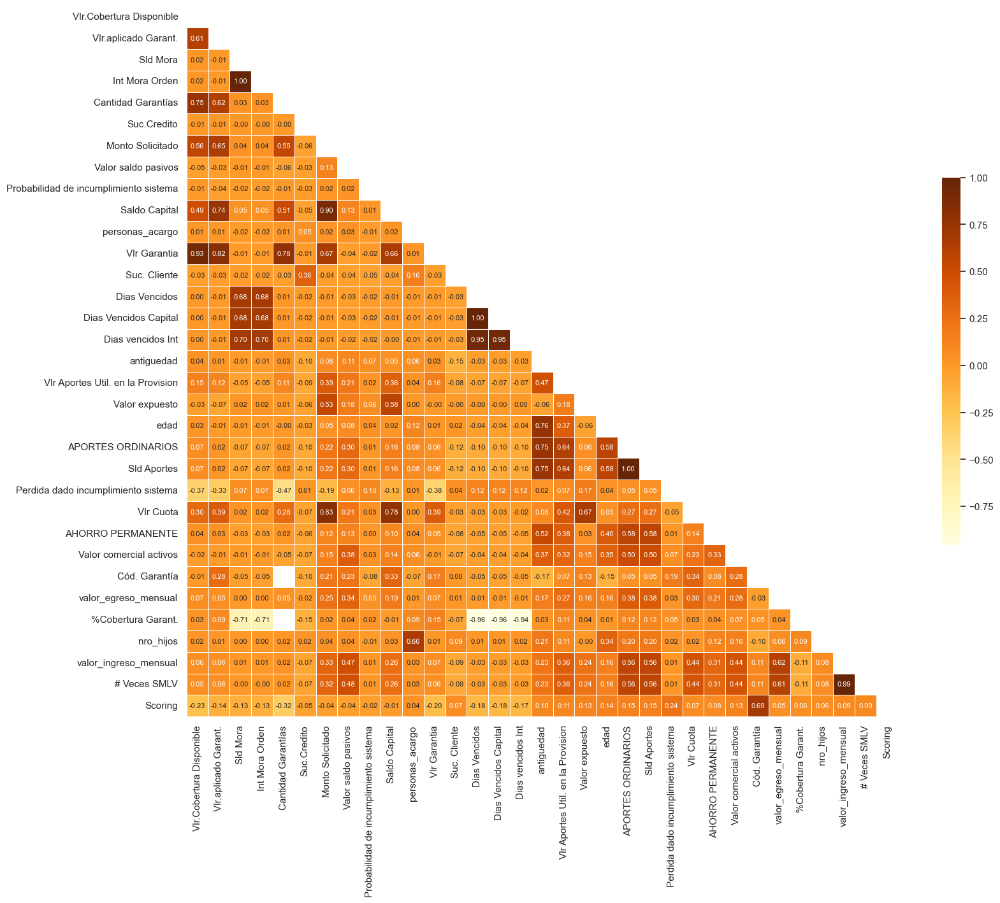

In [ ]:
# Filtrar el DataFrame para incluir solo las columnas de interés
columns_importance = [
    'Vlr.Cobertura Disponible', 'Vlr.aplicado Garant.', 'Sld Mora', 'Int Mora Orden',
    'Cantidad Garantías', 'Suc.Credito', 'Monto Solicitado', 'Valor saldo pasivos',
    'Probabilidad de incumplimiento sistema', 'Saldo Capital', 'personas_acargo',
    'Vlr Garantia', 'Suc. Cliente', 'Dias Vencidos', 'Dias Vencidos Capital',
    'Dias vencidos Int', 'antiguedad', 'Vlr Aportes Util. en la Provision',
    'Valor expuesto', 'edad', 'APORTES ORDINARIOS', 'Sld Aportes',
    'Perdida dado incumplimiento sistema', 'Vlr Cuota', 'AHORRO PERMANENTE',
    'Valor comercial activos', 'Cód. Garantía', 'valor_egreso_mensual', '%Cobertura Garant.',
    'nro_hijos', 'valor_ingreso_mensual', '# Veces SMLV', 'Scoring','Scoring Interval']

# Filtrar el DataFrame para incluir solo las columnas de interés
df_importance = df[columns_importance]

# Calcular la matriz de correlación para las columnas seleccionadas
corr_importance = df_importance.corr()

# Graficar el mapa de calor para ver la correlación entre las variables seleccionadas
sns.set_theme(style="white")
f, ax = plt.subplots(figsize=(18, 15))  # Aumentar el tamaño de la figura

# Crear una máscara para el triángulo superior
mask = np.triu(np.ones_like(corr_importance, dtype=bool))

# Elegir una paleta de colores
cmap = sns.color_palette("YlOrBr", as_cmap=True)

# Dibujar el mapa de calor con la máscara y la correcta relación de aspectos
sns.heatmap(corr_importance, mask=mask, cmap=cmap, annot=True, annot_kws={'size': 8}, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, fmt='.2f')

plt.show()

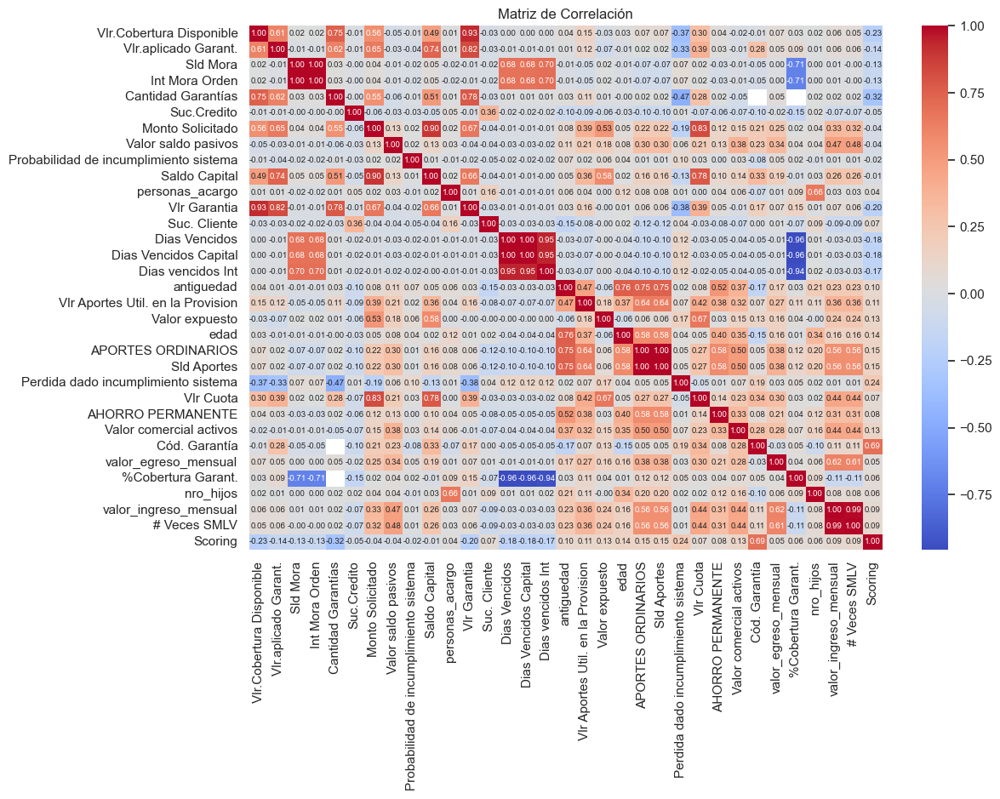

In [ ]:
### Visto el mapa de calor de otra manera:

# Generar el mapa de calor de la matriz de correlación
plt.figure(figsize=(12, 8))
sns.heatmap(corr_importance, annot=True, cmap="coolwarm", annot_kws={'size': 7}, fmt='.2f')
plt.title("Matriz de Correlación")
plt.show()

In [ ]:
df_importance.dtypes

Vlr.Cobertura Disponible                    int64
Vlr.aplicado Garant.                      float64
Sld Mora                                    int64
Int Mora Orden                              int64
Cantidad Garantías                          int64
Suc.Credito                                 int64
Monto Solicitado                            int64
Valor saldo pasivos                         int64
Probabilidad de incumplimiento sistema    float64
Saldo Capital                               int64
personas_acargo                             int64
Vlr Garantia                              float64
Suc. Cliente                                int64
Dias Vencidos                               int64
Dias Vencidos Capital                       int64
Dias vencidos Int                           int64
antiguedad                                  int64
Vlr Aportes Util. en la Provision         float64
Valor expuesto                            float64
edad                                        int64


## Variables categoricas a tratar

Para las variables categoricas, Estado,Medio de pago,Fec. Ult Afili,Fec. Ult retiro,seccion,
Tipo de asociado,Departamento,Fech.Ult.Act.Datos,Sexo,estado_civil,estrato,nivel_educativo, declara_renta, tipo_contrato,desc_tipo_vivienda,Clasificacion,Linea de credito,Destinacion,Modalidad,Medio de pago Obligación,Tipo Garantia, Periodicidad,Forma de Pago,Fec Ult.Pago,Codeudores,Garantía Real,Scoring Interval.

Se hace necesario definir un tratamiento especial, dado que por ser categoricas influyen en el modelo.


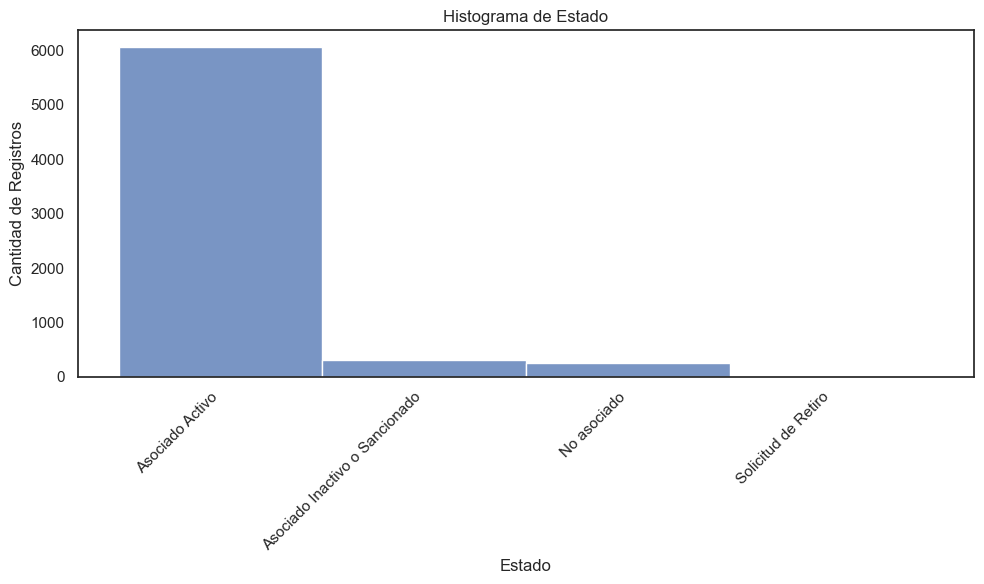

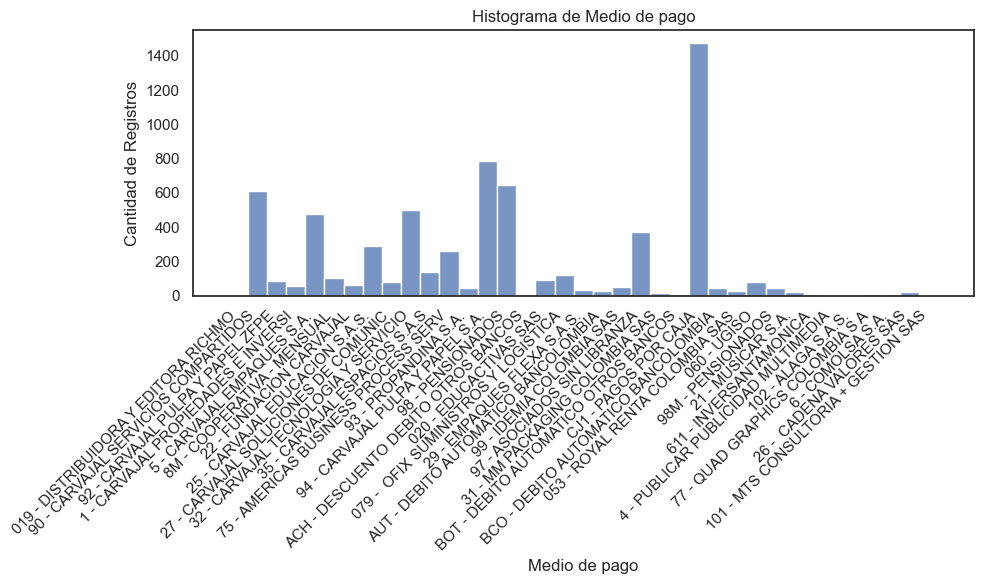

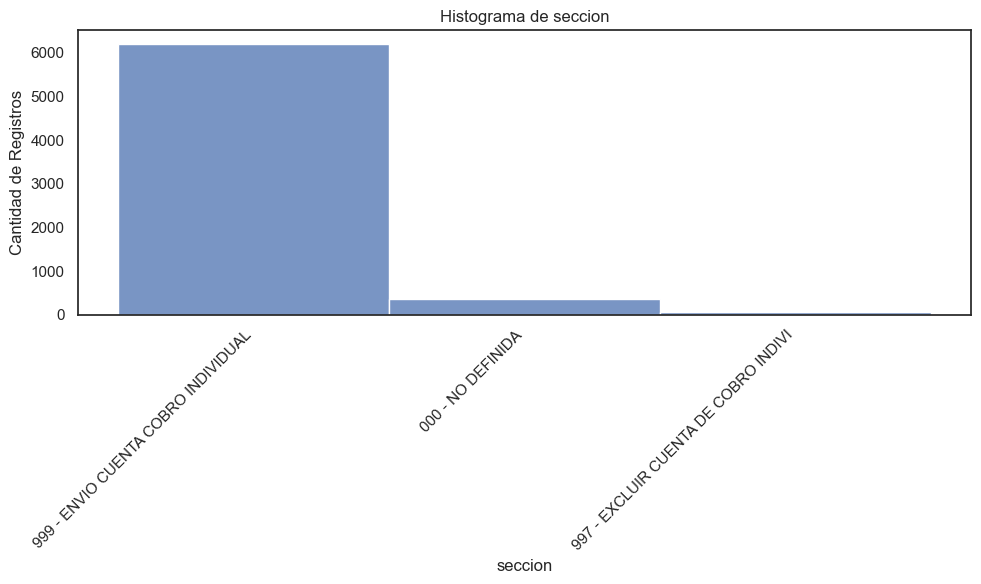

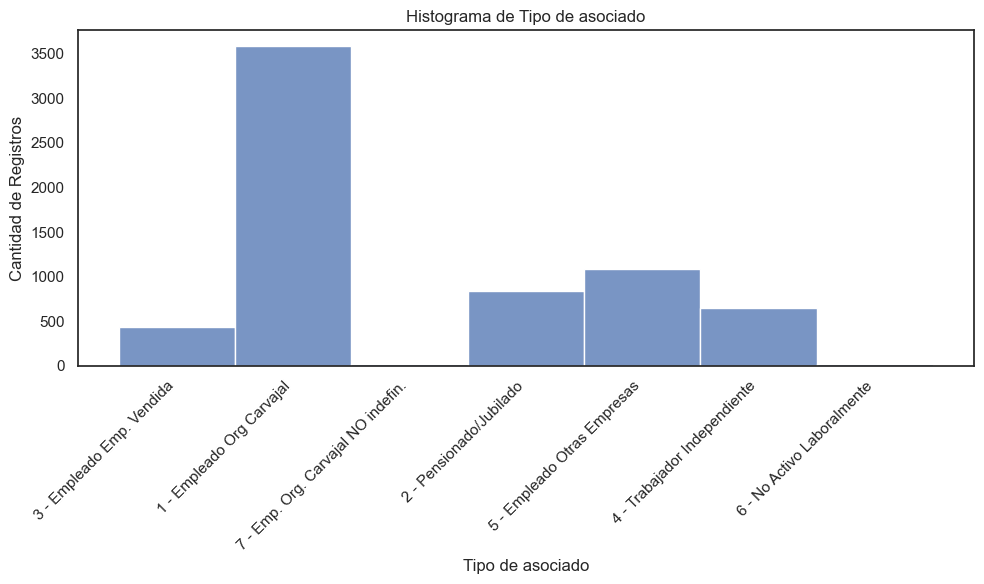

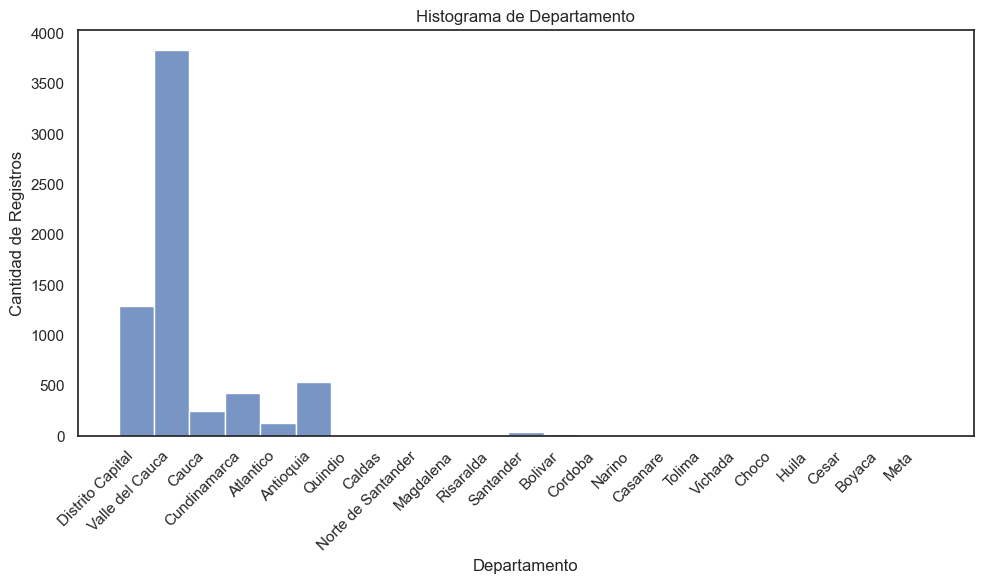

...

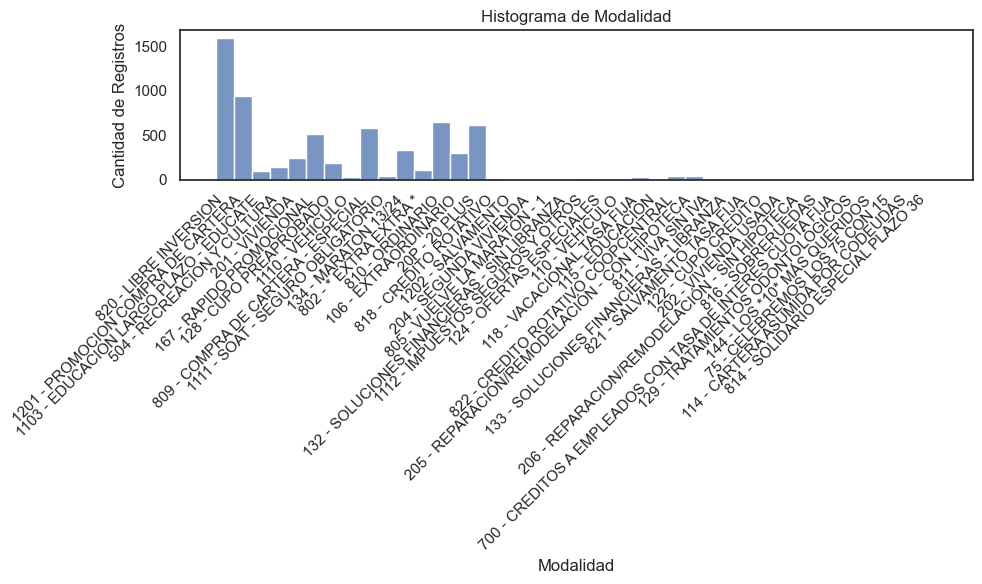

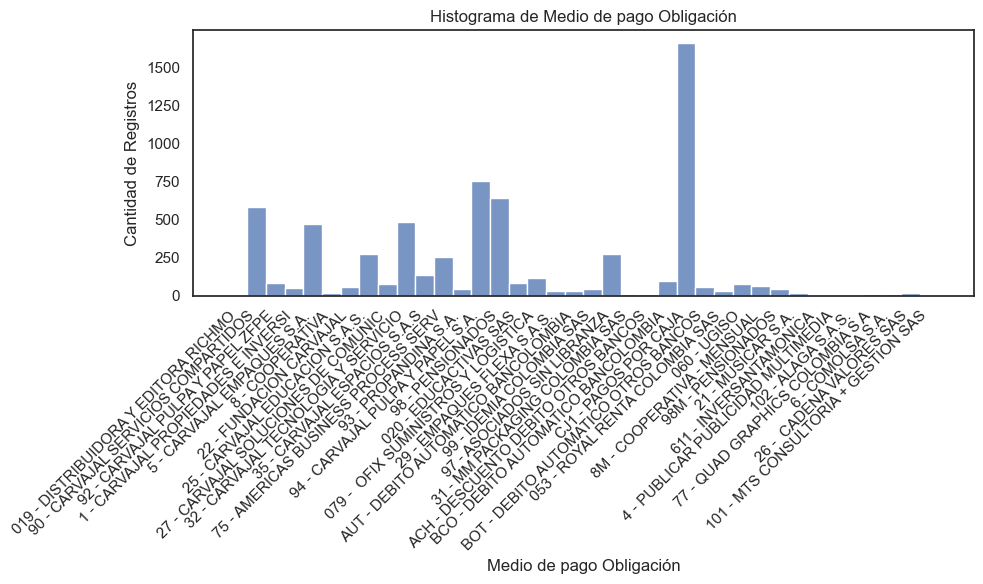

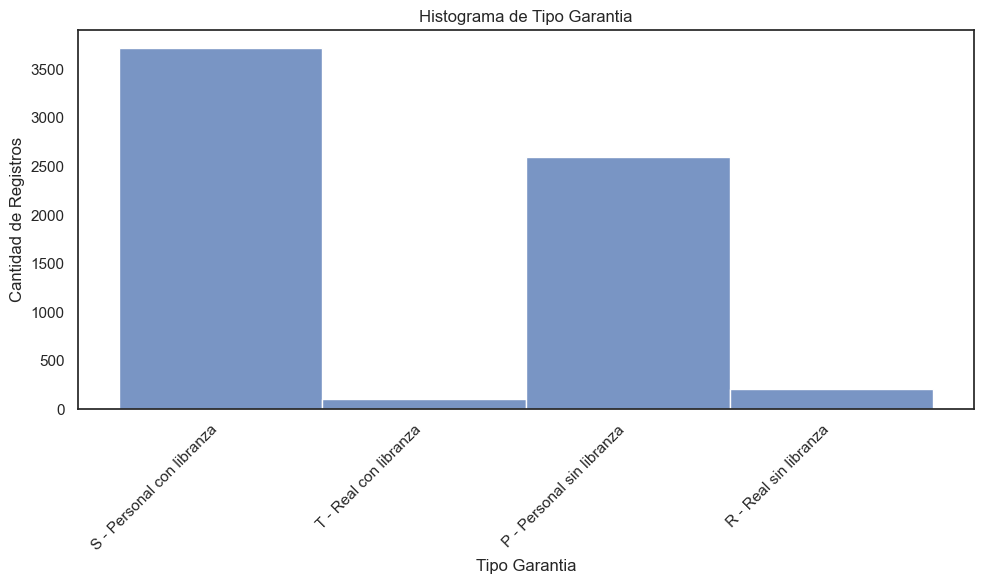

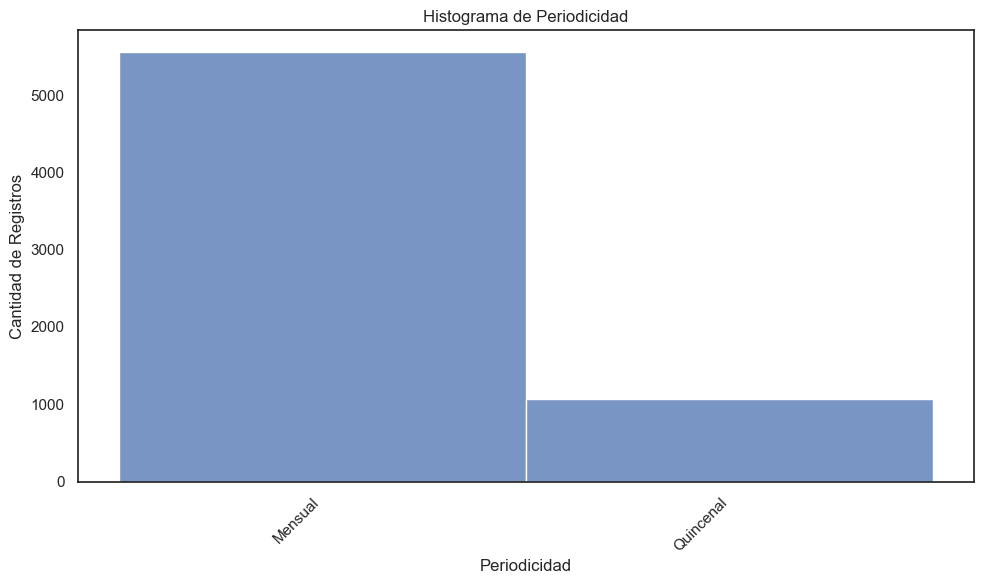

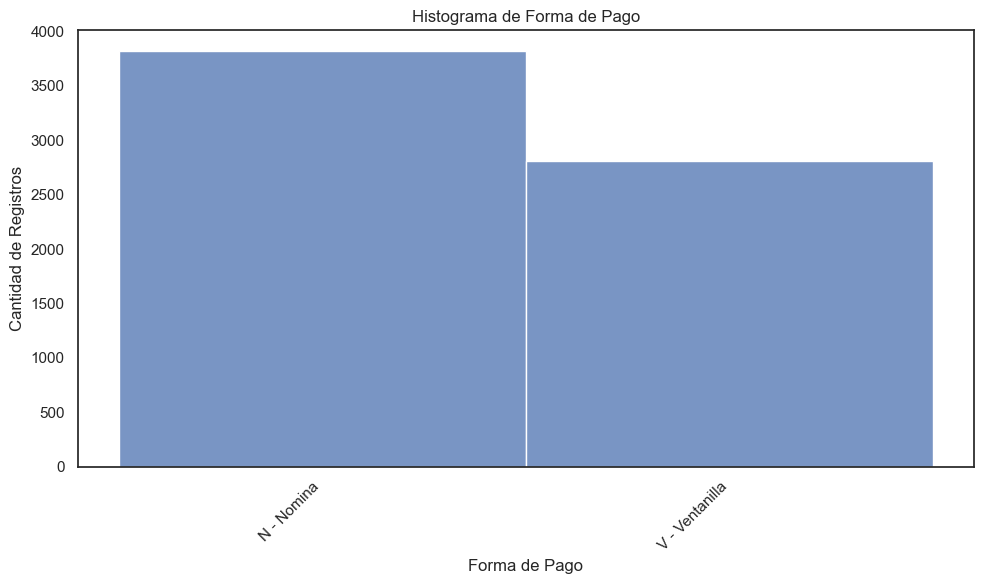

C:\Users\alejo\AppData\Local\Temp\ipykernel_13012\1000323789.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


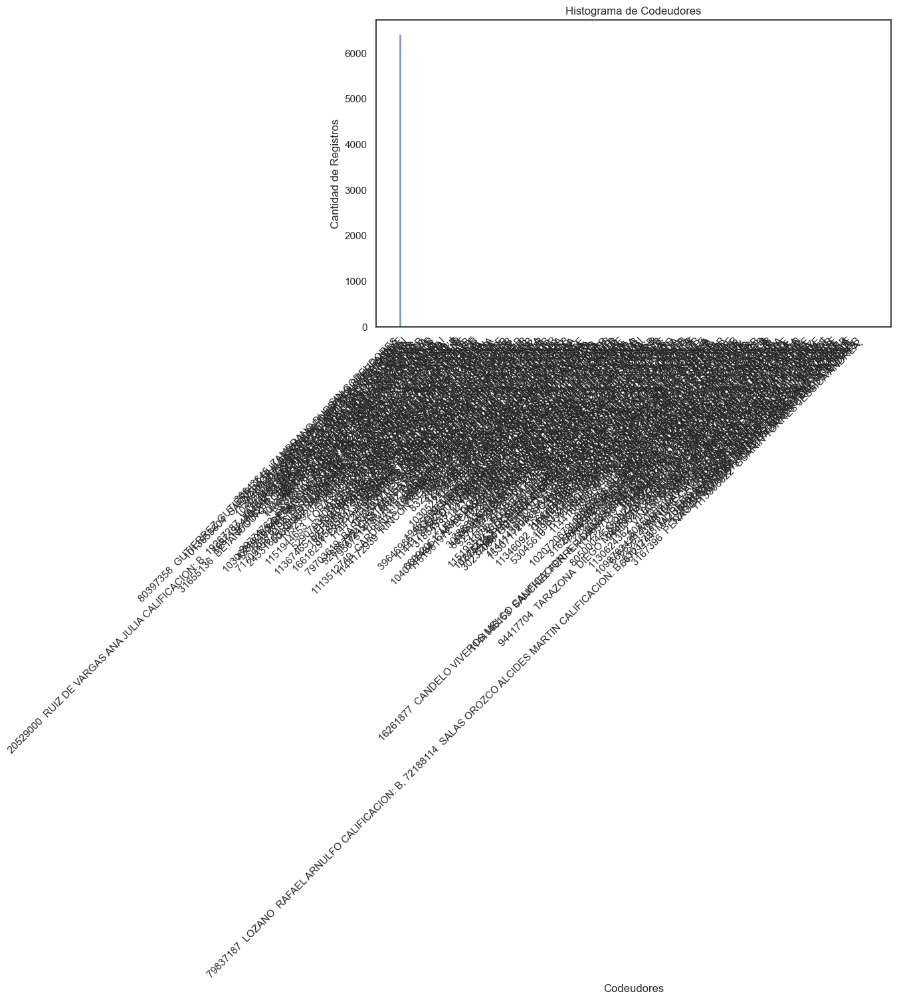

C:\Users\alejo\AppData\Local\Temp\ipykernel_13012\1000323789.py:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


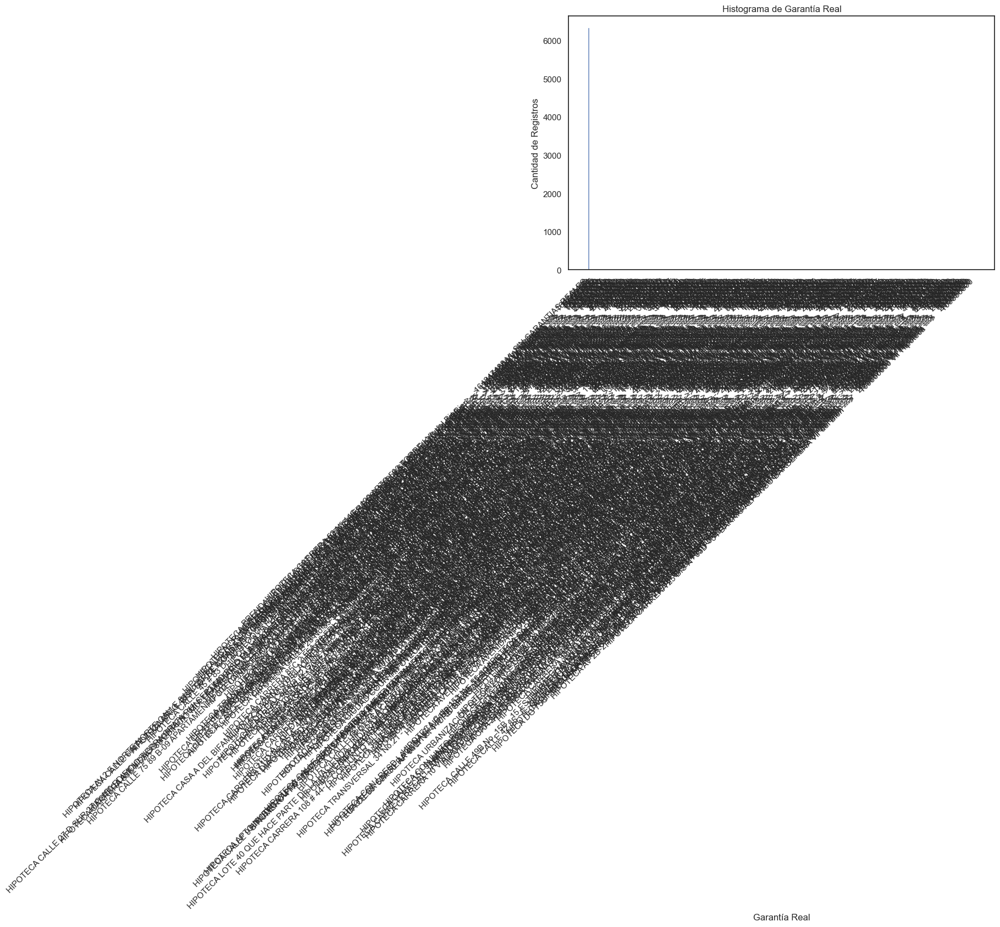

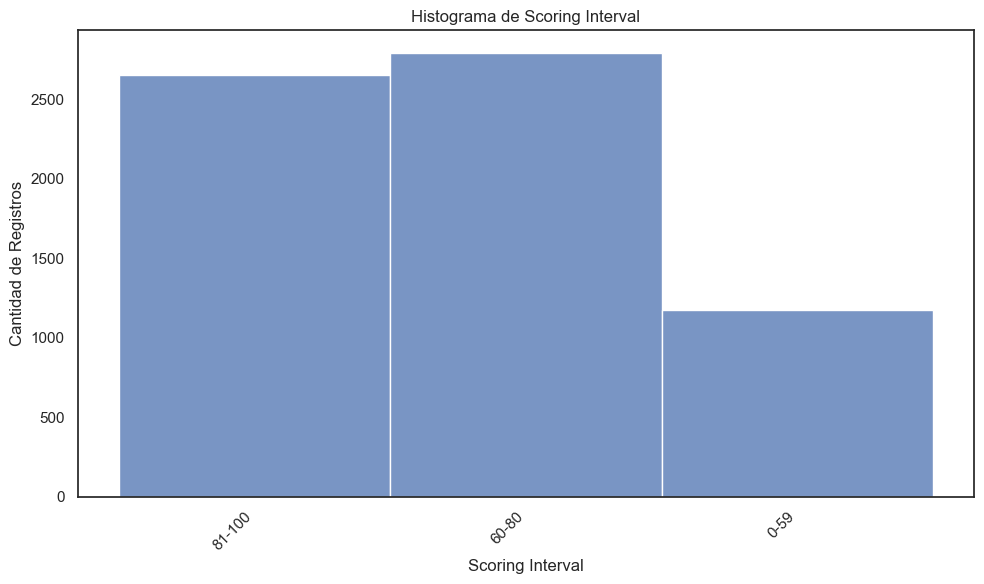

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Definir las columnas de interés
columns_of_interest = [
    'Estado', 'Medio de pago','seccion',
    'Tipo de asociado', 'Departamento', 'Sexo', 'estado_civil',
    'estrato', 'nivel_educativo', 'declara_renta', 'tipo_contrato', 'desc_tipo_vivienda',
    'Clasificacion', 'Linea de credito', 'Destinacion', 'Modalidad', 'Medio de pago Obligación',
    'Tipo Garantia', 'Periodicidad', 'Forma de Pago','Codeudores',
    'Garantía Real', 'Scoring Interval'
]

# Filtrar el DataFrame para incluir solo las columnas de interés
df_filtered = df[columns_of_interest]

# Crear histogramas para cada variable
for column in columns_of_interest:
    plt.figure(figsize=(10, 6))
    sns.histplot(df_filtered[column], kde=False)
    plt.title(f'Histograma de {column}')
    plt.xlabel(column)
    plt.ylabel('Cantidad de Registros')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
